In [1]:
# from SEAM.utils import *
# import SEAM
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import scanpy as sc
import palettable
import anndata as ad
import scanpy.external as sce
import sys
from scipy.stats import *
from sklearn.metrics import *

# settings

In [2]:
sc.set_figure_params(vector_friendly=False,format='pdf',transparent=True,dpi=200)

sns.set_style('white')
# font = {'family' : 'normal',
#         'weight' : 'bold',
#         'size'   : 2}

# matplotlib.rc('font', **font)
# matplotlib.rcParams.update({'font.size': 2})

import matplotlib.pyplot as plt

SMALL_SIZE = 8
MEDIUM_SIZE = 10
BIGGER_SIZE = 12

plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=SMALL_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title
cls_cmp = palettable.cartocolors.qualitative.Bold_10.mpl_colors

# functions

## MED

### MED pvalue

In [3]:
# import faiss
from sklearn.neighbors import NearestNeighbors
import time
import networkx as nx
def MED(adata,use_cls,nn,ME_var_names_np_unique,copy=False,spatial_var='spatial'):
    ## function: calculate mricroenvironment counting
#     use_cls = 'leiden'
#     nn = 8
#     adata_use = adata.copy()
    if copy:
        adata_use = adata.copy()
    else:
        adata_use = adata
        
    # 运行之后，adata增加了neighbor和ME
#     ME_var_names_np = np.unique(adata_use.obs[use_cls])
#     ME_var_names_np_unique = np.unique(adata_use.obs[use_cls])
    ME_var_names_np = np.arange(ME_var_names_np_unique.shape[0]).astype('str')
    # 这里存的是一个histogram，顺序(record frequency of every cell)
    adata_use.obsm['ME'] = np.zeros(shape=(adata_use.shape[0],ME_var_names_np.shape[0])) #frequency dim: n_cell*n_cluster
    # 还需要一个uns.ME_ground_distance


#     sc.pp.neighbors(adata_use,use_rep=spatial_var,n_neighbors=nn)
#     nn_mat = adata_use.uns['neighbors']['connectivities'].toarray()
    
#     sorted_nn = np.argsort(squareform(pdist(adata_use.obsm[spatial_var])),axis=1) #pdist: euclidean(improve: change?)
    ME_X = np.zeros(shape=(adata_use.shape[0],ME_var_names_np.shape[0]))
    time_start=time.time()
    spatial_mat = np.array(adata_use.obsm[spatial_var]).astype('int64')
    
#     ##############IndexFlatL2 knn search##############
#     index = faiss.IndexFlatL2(spatial_mat.shape[1])
#     index.add(spatial_mat)
#     D, I = index.search(spatial_mat, nn)

#     ##############IndexIVFFlat knn search##############
#     nlist=100
#     quantizer = faiss.IndexFlatL2(spatial_mat.shape[1])  # the other index
#     index = faiss.IndexIVFFlat(quantizer, spatial_mat.shape[1], nlist, faiss.METRIC_L2)
#     assert not index.is_trained
#     index.train(spatial_mat)
#     assert index.is_trained
#     index.add(spatial_mat)          
#     D, I = index.search(spatial_mat, nn)
#     ##############exact knn search##############
#     nbrs = NearestNeighbors(n_neighbors=nn, algorithm='brute').fit(spatial_mat)
#     D, I = nbrs.kneighbors(spatial_mat)
#     time_end=time.time()

    
#     ##############exact knn search##############
    fit = NearestNeighbors(n_neighbors=nn).fit(spatial_mat)
    m = fit.kneighbors(spatial_mat)
    #     m = m[0][:,1:], m[1][:,1:]
    m = m[0], m[1]


    #sort_neighbors
    args = m[0].argsort(axis = 1)
    add = np.arange(m[1].shape[0])*m[1].shape[1]
    I = m[1].flatten()[args+add[:,None]]
    time_end=time.time()
#     ##############knn end##############
    print('knn search time cost',time_end-time_start,'s')
    cls_array = adata_use.obs[use_cls]
    time_start=time.time()


    for i in range(I.shape[0]):
        
        
        

        if i%1000==0:
            time_end=time.time()
            
            print('{0} MEs,time cost {1} s, {2} MEs, {3}s left'.format(i,time_end-time_start,I.shape[0]-i,(I.shape[0]-i)*(time_end-time_start)/1000))
            time_start=time.time()
            
        cur_neighbors = I[i,:]
        
        cur_neighbors_cls = cls_array[cur_neighbors]
#         cur_neighbors_cls = adata_use[cur_neighbors].obs[use_cls]  #select the cluster idx of top-nn cells
        cur_cls_unique,cur_cls_count = np.unique(cur_neighbors_cls,return_counts=1) #counting for each cluster
        cur_cls_idx = [np.where(ME_var_names_np_unique==c)[0][0] for c in cur_cls_unique] #c is string
        ME_X[i,cur_cls_idx] = cur_cls_count
    adata_use.obsm['ME'] = ME_X
    if copy:
        return adata_use
    else:
        return ME_X #microenvironment counting
    

### MED naive

In [4]:
# import faiss
from sklearn.neighbors import NearestNeighbors
import time
import networkx as nx

def MED(adata,
        use_cls,
        nn,
        ME_var_names_np_unique,
        copy=False,
        spatial_var='spatial',
        ME_key_added='ME',#obsm下 ME的key名称
        MEidx_key_added='MEidx'#uns下每个ME中包含的cell index
       
       ):

    
    ## function: calculate mricroenvironment counting
#     use_cls = 'leiden'
#     nn = 8
#     adata_use = adata.copy()
    if copy:
        adata_use = adata.copy()
    else:
        adata_use = adata
        
    # 运行之后，adata增加了neighbor和ME
#     ME_var_names_np = np.unique(adata_use.obs[use_cls])
#     ME_var_names_np_unique = np.unique(adata_use.obs[use_cls])
    ME_var_names_np = np.arange(ME_var_names_np_unique.shape[0]).astype('str')
    # 这里存的是一个histogram，顺序(record frequency of every cell)
    adata_use.obsm[ME_key_added] = np.zeros(shape=(adata_use.shape[0],ME_var_names_np.shape[0])) #frequency dim: n_cell*n_cluster
    # 还需要一个uns.ME_ground_distance
    


#     sc.pp.neighbors(adata_use,use_rep=spatial_var,n_neighbors=nn)
#     nn_mat = adata_use.uns['neighbors']['connectivities'].toarray()
    
#     sorted_nn = np.argsort(squareform(pdist(adata_use.obsm[spatial_var])),axis=1) #pdist: euclidean(improve: change?)
    time_start=time.time()
    spatial_mat = np.array(adata_use.obsm[spatial_var]).astype('int64')
    
#     ##############IndexFlatL2 knn search##############
#     index = faiss.IndexFlatL2(spatial_mat.shape[1])
#     index.add(spatial_mat)
#     D, I = index.search(spatial_mat, nn)

#     ##############IndexIVFFlat knn search##############
#     nlist=100
#     quantizer = faiss.IndexFlatL2(spatial_mat.shape[1])  # the other index
#     index = faiss.IndexIVFFlat(quantizer, spatial_mat.shape[1], nlist, faiss.METRIC_L2)
#     assert not index.is_trained
#     index.train(spatial_mat)
#     assert index.is_trained
#     index.add(spatial_mat)          
#     D, I = index.search(spatial_mat, nn)
#     ##############exact knn search##############
#     nbrs = NearestNeighbors(n_neighbors=nn, algorithm='brute').fit(spatial_mat)
#     D, I = nbrs.kneighbors(spatial_mat)
#     time_end=time.time()

    
#     ##############exact knn search##############
    fit = NearestNeighbors(n_neighbors=nn).fit(spatial_mat)
    m = fit.kneighbors(spatial_mat)
    #     m = m[0][:,1:], m[1][:,1:]
    m = m[0], m[1]


    #sort_neighbors
    args = m[0].argsort(axis = 1)
    add = np.arange(m[1].shape[0])*m[1].shape[1]
    I = m[1].flatten()[args+add[:,None]]
    
    time_end=time.time()
#     ##############knn end##############
    print('knn search time cost',time_end-time_start,'s')
    cls_array = adata_use.obs[use_cls]

    adata_use.uns[MEidx_key_added] = I
    
#     ME_X = np.zeros(shape=(adata_use.shape[0],ME_var_names_np.shape[0]))
#     time_start=time.time()
#     for i in range(I.shape[0]):
        
        
        

#         if i%1000==0:
#             time_end=time.time()
            
            
#             print('{0} MEs,time cost {1} s, {2} MEs, {3}s left'.format(i,time_end-time_start,I.shape[0]-i,(I.shape[0]-i)*(time_end-time_start)/1000))
#             time_start=time.time()
            
#         cur_neighbors = I[i,:]
        
#         cur_neighbors_cls = cls_array[cur_neighbors]
# #         cur_neighbors_cls = adata_use[cur_neighbors].obs[use_cls]  #select the cluster idx of top-nn cells
#         cur_cls_unique,cur_cls_count = np.unique(cur_neighbors_cls,return_counts=1) #counting for each cluster
#         cur_cls_idx = [np.where(ME_var_names_np_unique==c)[0][0] for c in cur_cls_unique] #c is string
#         ME_X[i,cur_cls_idx] = cur_cls_count
    ME_X = MEidx2ME(I,cls_array,ME_var_names_np_unique)
    adata_use.obsm[ME_key_added] = ME_X
    
    if copy:
        return adata_use
    else:
        return ME_X #microenvironment counting
    
    
def MEidx2ME(I,cls_array,ME_var_names_np_unique):
    ME_X = np.zeros(shape=(I.shape[0],ME_var_names_np_unique.shape[0]))
    time_start=time.time()
    for i in range(I.shape[0]):
        
        
        

        if i%1000==0:
            time_end=time.time()
            
            
            print('{0} MEs,time cost {1} s, {2} MEs, {3}s left'.format(i,time_end-time_start,I.shape[0]-i,(I.shape[0]-i)*(time_end-time_start)/1000))
            time_start=time.time()
            
        cur_neighbors = I[i,:]
        
        cur_neighbors_cls = cls_array[cur_neighbors]
#         cur_neighbors_cls = adata_use[cur_neighbors].obs[use_cls]  #select the cluster idx of top-nn cells
        cur_cls_unique,cur_cls_count = np.unique(cur_neighbors_cls,return_counts=1) #counting for each cluster
        cur_cls_idx = [np.where(ME_var_names_np_unique==c)[0][0] for c in cur_cls_unique] #c is string
        ME_X[i,cur_cls_idx] = cur_cls_count
    return ME_X


### MED_multi

In [5]:
# def MED(adata,use_cls,nn,ME_var_names_np_unique,copy=False,spatial_var='spatial'):
def MED_multi(
    adata,
    use_cls,
    nn,
    ME_var_names_np_unique,
    copy=False,
    spatial_var='spatial',
    batch_obs='batch'
):
    unique_batch = np.unique(adata.obs[batch_obs])
    ME_var_names_np_unique = np.unique(adata.obs[use_cls]) 
    ME_whole = np.zeros(shape=(adata.shape[0],len(ME_var_names_np_unique)))
    for batch in unique_batch:
        cur_batch_index = np.where(adata.obs[batch_obs]==batch)
        cur_adata = adata[cur_batch_index]
        cur_ME = MED(cur_adata,use_cls,nn,ME_var_names_np_unique,False,spatial_var)
        ME_whole[cur_batch_index] = cur_ME
    adata.obsm['ME'] = ME_whole
    if copy:
        return adata
    else:
        return ME_whole
    


## GD

### geometric_median

In [6]:
# 需要计算每个cluster的重心
import numpy as np
from scipy.spatial.distance import cdist, euclidean

def geometric_median(X, eps=1e-5):
    y = np.mean(X, 0)

    while True:
        D = cdist(X, [y])
        nonzeros = (D != 0)[:, 0]

        Dinv = 1 / D[nonzeros]
        Dinvs = np.sum(Dinv)
        W = Dinv / Dinvs
        T = np.sum(W * X[nonzeros], 0)

        num_zeros = len(X) - np.sum(nonzeros)
        if num_zeros == 0:
            y1 = T
        elif num_zeros == len(X):
            return y
        else:
            R = (T - y) * Dinvs
            r = np.linalg.norm(R)
            rinv = 0 if r == 0 else num_zeros/r
            y1 = max(0, 1-rinv)*T + min(1, rinv)*y

        if euclidean(y, y1) < eps:
            return y1

        y = y1

In [7]:
# 未完成
def get_cls_median_idx(adata,cls_key,embed_key):
    cat = np.array(adata.obs[cls_key].cat.categories)
    embed_mat = np.array(adata.obsm[embed_key])
    cls_array = np.array(adata.obs[cls_key])

    median_array = np.zeros(shape=(len(cat),embed_mat.shape[1]))
    for i in range(len(cat)):
        c = cat[i]
        cur_points = embed_mat[np.where(cls_array==c)]
        median_array[i] = geometric_median(cur_points)

### get_embed_geomedian_geodist

In [8]:
def get_embed_geomedian_geodist(adata,cls_key,embed_key):
#     cls_key = 'gt_ct'
#     embed_key = 'X_phate'

    cat = np.array(adata.obs[cls_key].cat.categories)
    embed_mat = np.array(adata.obsm[embed_key])
    cls_array = np.array(adata.obs[cls_key])

    median_array = np.zeros(shape=(len(cat),embed_mat.shape[1]))
    for i in range(len(cat)):
        c = cat[i]
        cur_points = embed_mat[np.where(cls_array==c)]
        median_array[i] = geometric_median(cur_points)
        
#         mean_array[i] = np.mean(embed_mat[np.where(cls_array==c)])
    embed_mat_extend = np.vstack([embed_mat,median_array])
    iso = Isomap()
    iso.fit(embed_mat_extend)
    dist_mat = iso.dist_matrix_[-len(cat):,-len(cat):]

#     dist_mat = squareform(pdist(mean_array))
    return dist_mat
    

### dpt_distance

In [9]:
def dpt_distance(adata,cls_key):
    sc.tl.diffmap(adata)
    cat = np.array(adata.obs[cls_key].cat.categories)
#     先记录每一个cls用哪个root，这个函数里默认用第0个
    root_list = np.zeros(shape=(len(cat),))
    for i in range(len(cat)):
        c = cat[i]
#         adata.uns['iroot'] = np.flatnonzero(adata.obs[cls_key] == c)[0]
        root_list[i] = (np.flatnonzero(adata.obs[cls_key] == c)[0])
    
    dpt_mat = np.zeros(shape=(len(cat),len(cat)))
    for i in range(len(cat)):
        sc.tl.dpt(adata)
        dpt_mat[i] = adata.obs['dpt_pseudotime'][root_list]
    return dpt_mat
        

### get_ground_distance

In [10]:
import pyemd
from scipy.spatial.distance import *

def get_cls_center(adata,cls_key,embed_key):
#     cls_key = 'gt_ct'
#     embed_key = 'X_phate'

    cat = np.array(adata.obs[cls_key].cat.categories)
    embed_mat = np.array(adata.obsm[embed_key])
    cls_array = np.array(adata.obs[cls_key])

    mean_array = np.zeros(shape=(len(cat),embed_mat.shape[1]))
    for i in range(len(cat)):
        c = cat[i]
        mean_array[i] = np.mean(embed_mat[np.where(cls_array==c)])
    dist_mat = squareform(pdist(mean_array))
    return dist_mat
    
    
def get_ground_distance(adata,method='paga_guided_umap',cls_key=None,embed_key=None,connect_threshold=0.5): 
    
    n_cls = np.array(adata.obs[cls_key].cat.categories).shape[0]
    if method == 'paga_graph':
        adj_mat_use = adata.uns['paga']['connectivities'].toarray()
#         adj_mat_use[adj_mat_use==0] = -np.inf
#         adj_mat_use = 1-adj_mat_use
        adj_mat_use = 1/adj_mat_use

        np.fill_diagonal(adj_mat_use,0)
        G = nx.from_numpy_matrix(adj_mat_use)

        len_path = dict(nx.all_pairs_dijkstra_path_length(G))
        ground_distance_mat = np.inf*np.ones(shape=(len(len_path),len(len_path)))

        for i in range(ground_distance_mat.shape[0]):
            for j in range(ground_distance_mat.shape[1]):
                ground_distance_mat[i,j] = len_path[i][j]
        np.fill_diagonal(ground_distance_mat,0)
    elif method =='paga':
        adj_mat_use = adata.uns['paga']['connectivities'].toarray()
#         adj_mat_use[adj_mat_use==0] = -np.inf
        adj_mat_use = 1-adj_mat_use
        np.fill_diagonal(adj_mat_use,0)
        ground_distance_mat = adj_mat_use
    elif method =='euclidean':   #lower bound of MED(approximation)
        ground_distance_mat = squareform(pdist(adata.uns['paga']['pos']))
    elif method == 'uniform':
#         sz = adata.uns['paga']['pos'].shape[0]
        ground_distance_mat = np.ones(shape=(n_cls,n_cls))
        np.fill_diagonal(ground_distance_mat,0)
    elif method == 'embed':
#         cls_key = ''
        if cls_key is None or embed_key is None:
            print('need cls_ley or embed_key')
            return
        ground_distance_mat = get_cls_center(adata,cls_key,embed_key)
    elif method=='paga_guided_umap':
#         需要预先跑umap,paga,paga_compare
#         connect_threshold = 0.5
        
        embed_center = adata.uns['paga']['pos']
        embed_center_distmat = squareform(pdist(embed_center))

        adjacent_paga = adata.uns['paga']['connectivities'].toarray()
        adjacent_paga_bool = (adjacent_paga>=connect_threshold).astype('int')


        # connectitive取threshold之后，有些cluster被隔离。这里需要把把被隔离的cluster与被隔离前connectitivity最大的cluster相连。系数要不要*2？
        # 有没有可能两个cluster之间connectitive完全是0？不太可能。。。。吧
        disconnected_cluster_idxs = np.where(np.sum(adjacent_paga_bool,axis=0)==0)[0]
        for dis_idx in disconnected_cluster_idxs:
            cur_argmax = np.argmax(adjacent_paga[:,dis_idx])
            adjacent_paga_bool[dis_idx,cur_argmax] = 1
            adjacent_paga_bool[cur_argmax,dis_idx] = 1

        paga_guided_dist = np.multiply(embed_center_distmat,adjacent_paga_bool)
        # 会有问题，有可能有些subgraph之间断连
        G = nx.from_numpy_matrix(paga_guided_dist)
        # return G,embed_center_distmat,adjacent_paga_bool
        ground_distance_mat = -np.inf*np.ones_like(paga_guided_dist)
        # connected_components = [G.subgraph(c) for c in nx.connected_components(G)]
#         for sub_G in connected_components:
            
#             len_path = dict(nx.all_pairs_dijkstra_path_length(sub_G))
#             for i in len_path:
#                 for j in len_path[i]:
#                     ground_distance_mat[i][j] = len_path[i][j]
        
        
        
        len_path = dict(nx.all_pairs_dijkstra_path_length(G))
        # ground_distance_mat = np.inf*np.ones(shape=(len(len_path),len(len_path)))
        for i in len_path.keys():
            for j in len_path[i].keys():
                ground_distance_mat[i,j] = len_path[i][j]
        np.fill_diagonal(ground_distance_mat,0)
        max_val = np.max(ground_distance_mat)
        np.nan_to_num(ground_distance_mat,copy=False,neginf=max_val*2)
        # for i in range(ground_distance_mat.shape[0]):
        #     for j in range(ground_distance_mat.shape[1]):
        #         ground_distance_mat[i,j] = len_path[i][j]
        
    adata.uns['GD'] = ground_distance_mat
    return ground_distance_mat
    
    
#PhEMD: phenotypic earth mover’s distance’ (Uncovering axes of variation among single-cell cancer specimens)
def MED_phEMD(adata,  
              GD_method='euclidean',
              MED_knn=30,
              CT_obs='clusters',
              ifspatialplot=True,
              OT_method='pyemd',
              ME_precompyted=False,
              GD_precomputed=False
             ):
    
    
    # calculate ground distance, paga requried
    if not GD_precomputed:
        ground_distance_mat = get_ground_distance(adata,method=GD_method)
    else:
        ground_distance_mat = adata.uns['GD']
    # get ME histogram
    if not ME_precompyted:
        MED(adata,CT_obs,MED_knn)
    ME_mat = adata.obsm['ME']


    # calculate EMD matrix
    import time
    ME_mat = adata.obsm['ME']
    ME_dist_EMD = np.zeros(shape=(ME_mat.shape[0],ME_mat.shape[0]))
    time_cost = 0
    time_start = 0
    time_end = 0
    for i in range(ME_mat.shape[0]):
        if i%100==0:
            time_end = time.time()
            time_cost = time_end-time_start
            print(i,time_cost)
            time_start = time.time()

        for j in range(i,ME_mat.shape[0]):
            first_histogram = ME_mat[i,:]
            second_histogram = ME_mat[j,:]
            first_histogram = first_histogram/np.sum(first_histogram)
            second_histogram = second_histogram/np.sum(second_histogram)
            if OT_method=='pyemd':
                cur_dist = pyemd.emd(first_histogram,second_histogram,ground_distance_mat)
    #         print(i,j,cur_dist)
            elif OT_method=='POT':
                first_histogram = first_histogram/np.sum(first_histogram)
                second_histogram = second_histogram/np.sum(second_histogram)
                cur_dist = ot.emd2(first_histogram,second_histogram,ground_distance_mat)
            ME_dist_EMD[i,j] = cur_dist
            ME_dist_EMD[j,i] = cur_dist
    adata.obsm['X_ME_EMD_mat'] = ME_dist_EMD.copy()
    

#     # naive ME embedding and clustering
#     sc.pp.neighbors(adata,n_neighbors=30,use_rep='ME')
#     sc.tl.umap(adata,init_pos='random')
#     adata.obsm['X_umap_ME_naive'] = adata.obsm['X_umap'].copy()
#     sc.tl.leiden(adata,key_added='leiden_ME_naive')   #Cluster cells into subgroups
#     sc.tl.paga(adata,groups='leiden_ME_naive') #Mapping out the coarse-grained connectivity structures of complex manifolds
#     sc.pl.embedding(adata,basis='X_umap_ME_naive',color=[CT_obs,'leiden_ME_naive'])
#     if ifspatialplot:
#         sc.pl.embedding(adata, basis="spatial", color=[CT_obs,'leiden_ME_naive'])



#     # EMD matrix as feature ME embedding and clustering
#     sc.pp.neighbors(adata,n_neighbors=30,use_rep='X_ME_EMD_mat')
#     sc.tl.umap(adata)
# #     sc.tl.diffmap(adata)
#     sc.tl.leiden(adata,key_added='leiden_ME_EMD_feature',resolution=1)
#     adata.obsm['X_ME_EMD_feature_umap'] = adata.obsm['X_umap'].copy()
#     sc.pl.embedding(adata,basis='X_ME_EMD_feature_umap',color=['leiden_ME_naive','leiden_ME_EMD_feature'])
#     if ifspatialplot:
#         sc.pl.embedding(adata, basis="spatial", 
#                       color=[CT_obs,'leiden_ME_naive','leiden_ME_EMD_feature']
#                       )

    # UMAP ME embedding
#     ME_EMD_umap = umap.UMAP(metric='precomputed',n_neighbors=30).fit_transform(ME_dist_EMD)
#     adata.obsm['X_umap_ME_EMD'] = ME_EMD_umap
#     sc.pl.embedding(adata,basis='X_umap_ME_EMD',color=['leiden_ME_naive','leiden_ME_EMD_feature'])
    return adata

def cal_ME_heterogeneity(
    adata,
    copy=False,
    key_added='ME_heter',
    ME_key='ME' #用哪个ME key来计算heter
):
    if copy:
        adata_use = adata.copy()
    else:
        adata_use = adata
    ME_mat = adata_use.obsm[ME_key]
    GD_mat = adata_use.uns['GD']
    ME_heter_list = []
    for i in range(ME_mat.shape[0]):  #for each cell
        cur_ME = ME_mat[i,:]
        cur_heter = 0
        for j in range(ME_mat.shape[1]): #for each cluster
            cur_dist_add = np.sum(GD_mat[j]*cur_ME*cur_ME[j]) #edge count*edge value(ground distance)；cell frequency information is included in edge count
            cur_heter+=cur_dist_add
        ME_heter_list.append(cur_heter)
    if copy:
        adata_use.obs[key_added] = ME_heter_list
        return adata_use
    else:
        adata_use.obs[key_added] = ME_heter_list
        return 
    
    
    
def cal_permuted_ME_heterogeneity(
    adata,
    use_cls,
    ME_var_names_np_unique,
    copy=False,
    key_added='ME_heter', ##要加哪些内容？
    MEidx_key='MEidx_2x',#对于每一个cell，从哪个ME key里抽permutation
    permute_num=7, #从每一个ME里抽几个。比如每个ME中有n个，抽7个，就是C_n_7，但是考虑重复的细胞类型，可以计算出总的可能性数量
    n_perms=100
):
    
    if copy:
        adata_use = adata.copy()
    else:
        adata_use = adata
    
#     对每一个extended ME，选择permute_num个cell
    cls_array = adata_use.obs[use_cls]
    
    print(adata_use,MEidx_key)
    MEidx_mat = adata_use.uns[MEidx_key]
    
    heter_perm_mat = np.zeros(shape=(adata_use.shape[0],n_perms))
    for i_perm in range(n_perms):
        chose_MEidx_mat = np.zeros(shape=(MEidx_mat.shape[0],permute_num))
        
        for i in range(MEidx_mat.shape[0]):
            chose_MEidx_mat[i] = np.random.choice(MEidx_mat[i],permute_num,replace=False)

        chose_MEidx_mat = chose_MEidx_mat.astype('int')
        ME_mat = MEidx2ME(chose_MEidx_mat,cls_array,ME_var_names_np_unique)
        GD_mat = adata_use.uns['GD']

        adata_use.obsm['ME_perm'] = ME_mat
        cal_ME_heterogeneity(adata_use,key_added='heter_perm',ME_key='ME_perm')
        heter_perm_mat[:,i_perm] = adata_use.obs['heter_perm'].copy()
    adata_use.obsm[key_added] = heter_perm_mat

    if copy:
        return adata_use
    else:
        return 

    
def prepare_boundary_id(adata):
    exp_1_list = np.array(adata.obs['ME_heter'])
    spatial_mat = adata.obsm['spatial']


    exp_1_list =(exp_1_list-exp_1_list.min())/(exp_1_list.max()-exp_1_list.min())
    spatial_dist = 1/squareform(pdist(spatial_mat))


    polarity_1_max_list = []

    for i in range(len(exp_1_list)):
        dist_array = spatial_dist[i,:]
        polarity_1_array = dist_array*exp_1_list

        polarity_1_array = polarity_1_array[np.logical_not(np.isposinf(polarity_1_array))]

        polarity_1_array = polarity_1_array[np.logical_not(np.isnan(polarity_1_array))]



        polarity_1_max = np.max(polarity_1_array)



        polarity_1_max_list.append(polarity_1_max)

    #     polarity_1_array_list.append(polarity_1_array)
    adata.obs['polarity_1_max_list']=polarity_1_max_list


def test_polar(adata,gene):
    gene_profile = adata[:,test_gene].X.toarray()[:,0]
    #所有的cell和boundary的soft最短距离的倒数
    soft_dist_profile = adata.obs['polarity_1_max_list']
    pos_idx = (gene_profile>np.mean(gene_profile))
    #所有的gene posotive cell和boundary的soft距离
    pos_dist_profile = soft_dist_profile[pos_idx]
    logfc = np.log10(np.mean(pos_dist_profile)/np.mean(soft_dist_profile))
    pvalue = ttest_ind(soft_dist_profile,pos_dist_profile)[1]
    pvalue = -np.log10(pvalue)
    return pvalue,logfc


def plot_ME_cluster(adata,cls_idx,ME_cls_obs,cls_obs):

    # 要展示一个MEcluster的平均ME
    pd_dict = {
        'type':[],
        'count':[],
    }
    ME_cluster = np.array(adata[adata.obs[ME_cls_obs]==cls_idx].obsm['ME'])
    ME_var_names_np = np.unique(adata.obs[cls_obs])
    for i in range(ME_cluster.shape[0]):
        for j in range(ME_cluster.shape[1]):
            cur_val = ME_cluster[i,j]
            cur_type = ME_var_names_np[j]
            pd_dict['type'].append(cur_type)
            pd_dict['count'].append(cur_val)
    pd_df = pd.DataFrame(pd_dict)



    sns.set_style('white')
    fig,ax = plt.subplots(1,1,figsize=(10,3))
    # bar_y = adata[0].obsm['ME'][0,:]
    # bar_y=np.mean(adata[adata.obs['leiden']=='1'].obsm['ME'],axis=0)
    # bar_x = ME_var_names_np
    sns.barplot(x='type', y='count', data=pd_df,palette=adata.uns['{0}_colors'.format(cls_obs)])
    plt.title('ME cluster {0}'.format(cls_idx))

In [11]:
def generate_spatial_mat(sz):
#     sz = 256
    spatial_mat = []
    for i in range(sz[0]):
        for j in range(sz[1]):
            spatial_mat.append([i,j])
    spatial_mat = np.array(spatial_mat)
    return spatial_mat

## utils

### plot_matrix

In [12]:
def plot_matrix(mat):
    fig, ax = plt.subplots(figsize=(10,10))  
    sns.heatmap(mat,annot=True,ax=ax)
    plt.gca().set_aspect('equal', adjustable='box') 

In [13]:

def plot_scanpy_spatial_equal(adata,color,size=10,figsize=(10,10),marker='.'):
    n_plots = len(color)
    fig,axes = plt.subplots(1,n_plots,figsize=figsize)
    
    for i in range(n_plots):
        sc.pl.embedding(adata,basis="spatial",color=[color[i]],show=False,size=size,ax=axes[i],marker=marker)

    
        axes[i].set_aspect('equal', adjustable='box') 
#     axes[1].set_aspect('equal', adjustable='box') 
#     axes[2].set_aspect('equal', adjustable='box') 

    fig.tight_layout()

# plt.

### adata_preprocess

In [14]:
def adata_preprocess(i_adata, min_cells=3, pca_n_comps=300):
    print('===== Preprocessing Data ')
    sc.pp.filter_genes(i_adata, min_cells=min_cells)
    adata_X = sc.pp.normalize_total(i_adata, target_sum=1, exclude_highly_expressed=True, inplace=False)['X']
    adata_X = sc.pp.scale(adata_X)
    adata_X = sc.pp.pca(adata_X, n_comps=pca_n_comps)
    return adata_X


### load_ST_file

In [15]:


def load_ST_file(file_fold, count_file='filtered_feature_bc_matrix.h5', load_images=True, file_Adj=None):
    adata_h5 = sc.read_visium(file_fold, load_images=load_images, count_file=count_file)
    adata_h5.var_names_make_unique()

    if load_images is False:
        if file_Adj is None:
            file_Adj = os.path.join(file_fold, "spatial/tissue_positions_list.csv")

        positions = pd.read_csv(file_Adj, header=None)
        positions.columns = [
            'barcode',
            'in_tissue',
            'array_row',
            'array_col',
            'pxl_col_in_fullres',
            'pxl_row_in_fullres',
        ]
        positions.index = positions['barcode']
        adata_h5.obs = adata_h5.obs.join(positions, how="left")
        adata_h5.obsm['spatial'] = adata_h5.obs[['pxl_row_in_fullres', 'pxl_col_in_fullres']].to_numpy()
        adata_h5.obs.drop(columns=['barcode', 'pxl_row_in_fullres', 'pxl_col_in_fullres'], inplace=True)

    print('adata: (' + str(adata_h5.shape[0]) + ', ' + str(adata_h5.shape[1]) + ')')
    return adata_h5


## cluster merge

In [58]:
# cls_key = 'leiden_EMD'
# neighbor_key = 'neighbors_EMD'
# thresh = 0.5
def merge_cls_paga(cls_key = 'leiden_EMD',neighbor_key = 'neighbors_EMD',thresh = 0.5,min_cls=2,paga_plot=True):
    if f'{cls_key}_merge_colors' in adata.uns:
        del adata.uns[f'{cls_key}_merge_colors']
    adata.obs[f'{cls_key}_merge'] = adata.obs[cls_key].copy()
    merge_cls_list = []
    while True:
        
        sc.tl.paga(adata,groups=f'{cls_key}_merge',neighbors_key=neighbor_key)
        if paga_plot:
            sc.pl.paga(adata,color=[f'{cls_key}_merge'],threshold=0)
        
        cur_conn = adata.uns['paga']['connectivities'].toarray()
        cur_ME_cls = adata.obs[f'{cls_key}_merge'].copy()
        if len(cur_ME_cls.cat.categories)<=min_cls:
            break
        merge_cls_idx = np.unravel_index(np.argmax(cur_conn),cur_conn.shape)
        # print(merge_cls_idx)
        if cur_conn[merge_cls_idx]<thresh:
            break
        merge_cls_i = cur_ME_cls.cat.categories[merge_cls_idx[0]]
        merge_cls_j = cur_ME_cls.cat.categories[merge_cls_idx[1]]

        new_ME_cls = merge_cls(cur_ME_cls,merge_cls_i,merge_cls_j)
        # 这里要删掉idx为merge_cls_idx[0]的颜色
        print(adata.uns[f'{cls_key}_merge_colors'])
        del adata.uns[f'{cls_key}_merge_colors'][merge_cls_idx[0]]
        print(adata.uns[f'{cls_key}_merge_colors'])

        new_ME_cls = new_ME_cls.cat.remove_unused_categories()
        merge_cls_list.append(new_ME_cls.copy())
        adata.obs[f'{cls_key}_merge'] = new_ME_cls
        
    adata.uns['merge_cls_list'] = merge_cls_list

In [17]:
# merge_cls: merge cls_i to cls_j
# input: old_cls(categories), cls_i,cls_j.
def merge_cls(old_cls,cls_i,cls_j):
    # cls_i = '3'
    # cls_j = '8'
    
    # old_cls = cur_ME_cls
    old_cls[old_cls==cls_i] = cls_j
    print(f'merged {cls_i} to {cls_j}')
    return old_cls



## knn smoothing

In [18]:
import pandas as pd

In [19]:
# 可以用predict_proba? 迭代几次都累乘
# 应该用radius,或者voinoi
from sklearn.neighbors import KNeighborsClassifier
def knn_smooth(adata,cls_key='louvain',knn_iters=1,diff_threshold=100,knn=10,weights_mode='paga'):
    if weights_mode=='paga':
        cls_conn = adata.uns['paga']['connectivities'].toarray()
        weights = 'design_weights'
        np.fill_diagonal(cls_conn,1)
    elif weights_mode=='paga_geodesic':
        cls_conn = adata.uns['GD'].copy()
#         np.fill_diagonal(cls_conn,1)
        cls_conn = 1/(cls_conn+1)
        weights='design_weights'
    else:
        weights='uniform'
        cls_conn = None

        
        
        
#     pred_y = np.array(adata.obs[cls_key]).astype('str')
    pred_y = adata.obs[cls_key]
    cat_order = np.array(adata.obs[cls_key].cat.categories)
    for i in range(knn_iters):
#         clf = KNeighborsClassifier(n_neighbors=knn,metric='euclidean')
        clf = My_KNeighborsClassifier(n_neighbors=knn,metric='euclidean',weights=weights,cls_sim=cls_conn)

        clf.fit(adata.obsm['spatial'],pred_y)
        cur_pred = np.array(clf.predict(adata.obsm['spatial'])).astype('str')
        print(np.sum(cur_pred!=pred_y))
        if np.sum(cur_pred!=pred_y)<=diff_threshold:
#         if np.array_equal(cur_pred,pred_y):
            print('converge i={0}'.format(i))
            break
        
        pred_y = pd.Series(cur_pred).astype('category').cat.reorder_categories(cat_order)
#         return pred_y,cur_pred
    adata.obs['{0}_knn'.format(cls_key)] = np.array(pred_y)
    adata.obs['{0}_knn'.format(cls_key)] = adata.obs['{0}_knn'.format(cls_key)].astype('category')
    adata.obs['{0}_knn'.format(cls_key)].cat.reorder_categories(adata.obs[cls_key].cat.categories,inplace=True)
    return pred_y

In [20]:
import numpy as np
from scipy import stats
from sklearn.utils.extmath import weighted_mode
from sklearn.utils.validation import _is_arraylike,_num_samples


from sklearn.neighbors._base import \
    _check_weights, _get_weights, \
    NeighborsBase, KNeighborsMixin,\
    RadiusNeighborsMixin
# from sklearn.neighbors.base import SupervisedIntegerMixin
from sklearn.base import ClassifierMixin
from sklearn.utils import check_array


In [21]:
class My_KNeighborsClassifier(KNeighborsMixin, ClassifierMixin, NeighborsBase):


    def __init__(
        self,
        n_neighbors=5,
        *,
        weights="uniform",
        algorithm="auto",
        leaf_size=30,
        p=2,
        metric="minkowski",
        metric_params=None,
        n_jobs=None,
        cls_sim = None
    ):
        super().__init__(
            n_neighbors=n_neighbors,
            algorithm=algorithm,
            leaf_size=leaf_size,
            metric=metric,
            p=p,
            metric_params=metric_params,
            n_jobs=n_jobs,
        )
        self.weights = weights
        self.cls_sim = cls_sim

    def fit(self, X, y):
#         y必须是category类型
        """Fit the k-nearest neighbors classifier from the training dataset.
        Parameters
        ----------
        X : {array-like, sparse matrix} of shape (n_samples, n_features) or \
                (n_samples, n_samples) if metric='precomputed'
            Training data.
        y : {array-like, sparse matrix} of shape (n_samples,) or \
                (n_samples, n_outputs)
            Target values.
        Returns
        -------
        self : KNeighborsClassifier
            The fitted k-nearest neighbors classifier.
        """
        print('fit1')
        self.class__ = np.array(y.cat.categories)
        self.__y = np.array(y.cat.codes)
        y = np.array(y)
        
        if self.weights!='design_weights':
            self.weights = _check_weights(self.weights)
        
        print('fit2')
        
        return self._fit(X, y)

    def predict(self, X):
        print('predict')
        """Predict the class labels for the provided data.
        Parameters
        ----------
        X : array-like of shape (n_queries, n_features), \
                or (n_queries, n_indexed) if metric == 'precomputed'
            Test samples.
        Returns
        -------
        y : ndarray of shape (n_queries,) or (n_queries, n_outputs)
            Class labels for each data sample.
        """
        cls_conn = self.cls_sim
        neigh_dist, neigh_ind = self.kneighbors(X)
        neigh_dist = neigh_dist[:,1:]
        neigh_ind = neigh_ind[:,1:]
#         return neigh_dist, neigh_ind
#         neigh_dist: n*knn

        print(self.classes_.shape,self._y.shape)
    
#         classes_ = self.classes_
#         _y = self._y
        classes = self.class__
        _y = self.__y


        if not self.outputs_2d_:
            _y = self.__y.reshape((-1, 1))
            classes_ = [self.class__]
#         print(classes_)

        n_outputs = len(classes_)
        n_queries = _num_samples(X)
#         return neigh_dist
        
        print(_y.shape)
        if self.weights=='design_weights':
            # cls_idx = np.array(adata.obs['leiden']).astype('int')
            # 每一个cell的cluster的index
#             cls_idx = np.array(adata.obs['leiden'].cat.codes)
            cls_idx = _y.reshape(-1,)


            # 预测每一个cell的时候，用哪一套conn
            cell_conn_mat = cls_conn[cls_idx]

            # neigh_ind是每个细胞的knn的index，需要转为cls_idx
            neigh_ind_cls = cls_idx[neigh_ind]


            # Select elements in each row with column indices from another array [duplicate]
            # https://stackoverflow.com/questions/61742001/select-elements-in-each-row-with-column-indices-from-another-array
            weights = cell_conn_mat[np.indices(neigh_ind_cls.shape)[0], neigh_ind_cls]
        else:
            weights = _get_weights(neigh_dist, self.weights)
#         return _y,neigh_ind
        
        weights1 = weights
        weights2 = _get_weights(neigh_dist, 'distance')

#         return weights1,weights2,neigh_dist, neigh_ind

        y_pred = np.empty((n_queries, n_outputs), dtype=classes_[0].dtype)
        print(y_pred.shape)
        for k, classes_k in enumerate(classes_):
#             return _y,neigh_ind
#             return (weights)
            if weights is None:
                mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
#                 _y[neigh_ind, k]: n*n_cls.每一行代表这个细胞的neighbor中，都有哪些细胞类型（idx），注意不是频率。
#                 return _y,neigh_ind,_y[neigh_ind, k],weights
                
            else:
                mode, _ = weighted_mode(_y[neigh_ind, k], weights, axis=1)
#                 return _y,neigh_ind,_y[neigh_ind, k],weights
            mode = np.asarray(mode.ravel(), dtype=np.intp)
#             一直到这里mode都是cls的idx，在下一步从class_k中take那些cls的name
#             return classes_k,mode
            y_pred[:, k] = classes_k.take(mode)
        if not self.outputs_2d_:
            y_pred = y_pred.ravel()

        return y_pred


In [22]:
1+1

2

# data loading

In [23]:
import scanpy as sc
import squidpy as sq

sc.logging.print_header()
print(f"squidpy=={sq.__version__}")


scanpy==1.8.2 anndata==0.7.8 umap==0.5.2 numpy==1.21.2 scipy==1.7.1 pandas==1.3.4 scikit-learn==1.0.1 statsmodels==0.13.0 python-igraph==0.9.8 pynndescent==0.5.5
squidpy==1.1.2


### pixel data

In [26]:

data_name = '23'
data_root = '/aaa/jianhuayao/project2/zhiyuanyuan/PUBDT/st/mibi/scmep/h5ad/scMEP_pixel_CT_mask_h5ad'
# data_folder = '/aaa/jianhuayao/project2/zhiyuanyuan/PUBDT/st/st/SpatialLIBD/raw/151507'
adata = sc.read_h5ad(f'{data_root}/{data_name}.h5ad')


### cell data

In [27]:

data_name = 'MIBI'
data_root = '/PUBDT/st/mibi/scmep/h5ad'
adata = sc.read_h5ad(f'{data_root}/{data_name}.h5ad')


In [28]:
adata_all = adata.copy()

In [34]:
adata = adata_all[adata_all.obs['point']=='23']

In [36]:
# sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.tl.leiden(adata,resolution=1)

# test

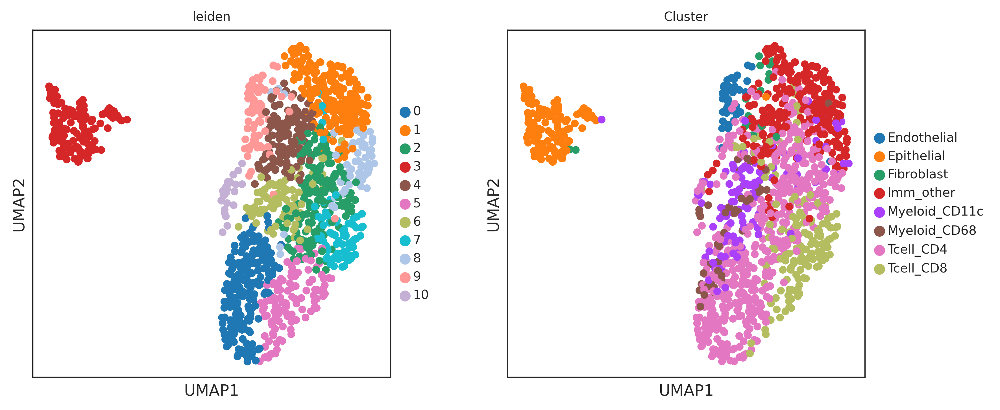

In [37]:
# without normalization and log
sc.pl.umap(adata,color=['leiden','Cluster'])

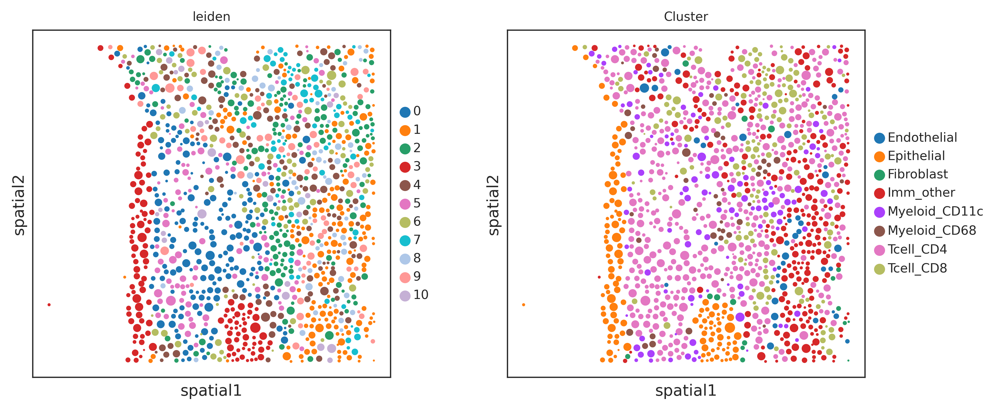

In [38]:
sc.pl.embedding(adata, basis='spatial', color=['leiden','Cluster'], size=adata.obs['cell_size']/10) 


# ME

In [39]:
knn = 10
spatial_var='spatial'
cls_key='Cluster'
ME_var_names_np_unique = np.unique(adata.obs[cls_key]) 

MED(adata,use_cls=cls_key,nn=knn,copy=False,ME_var_names_np_unique=ME_var_names_np_unique,spatial_var=spatial_var) 


knn search time cost 0.0031425952911376953 s
0 MEs,time cost 1.6689300537109375e-06 s, 1241 MEs, 2.0711421966552733e-06s left
1000 MEs,time cost 0.15375161170959473 s, 241 MEs, 0.03705413842201233s left


array([[0., 8., 1., ..., 0., 0., 0.],
       [0., 7., 1., ..., 0., 0., 0.],
       [0., 5., 1., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 3., 1.],
       [0., 0., 0., ..., 1., 6., 0.],
       [0., 0., 0., ..., 0., 3., 6.]])

# CN analysis

## uniform ground distance

In [40]:
gd_method = 'uniform'
cls_key = 'Cluster'
gd = get_ground_distance(adata,method=gd_method,cls_key=cls_key,embed_key=None,connect_threshold=0.1)  


In [41]:
heter_key = 'ME_heter_{0}_{1}'.format(cls_key,gd_method)

cal_ME_heterogeneity(adata,copy=False,key_added=heter_key) 

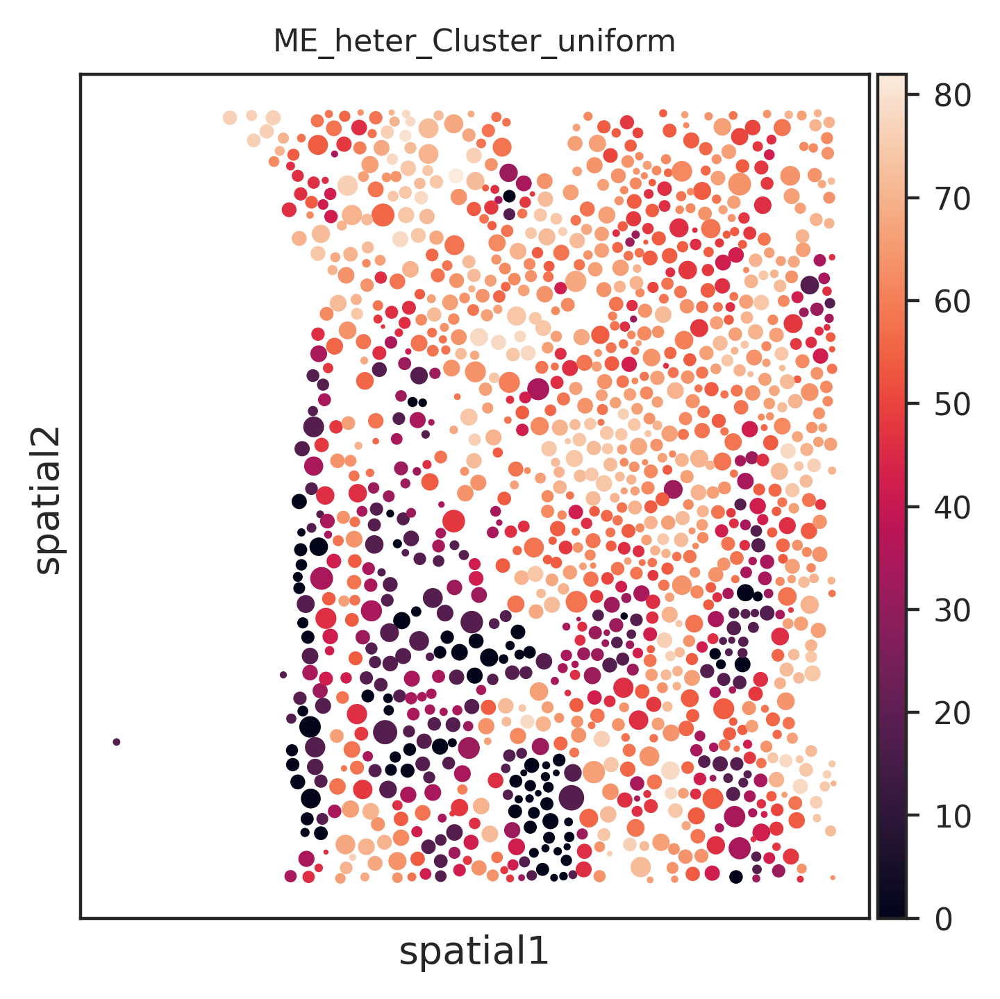

In [42]:
sc.pl.embedding(adata, basis='spatial', color=['ME_heter_Cluster_uniform'], size=adata.obs['cell_size']/10) 


# SOTIP analysis

## PAGAumap ground distance

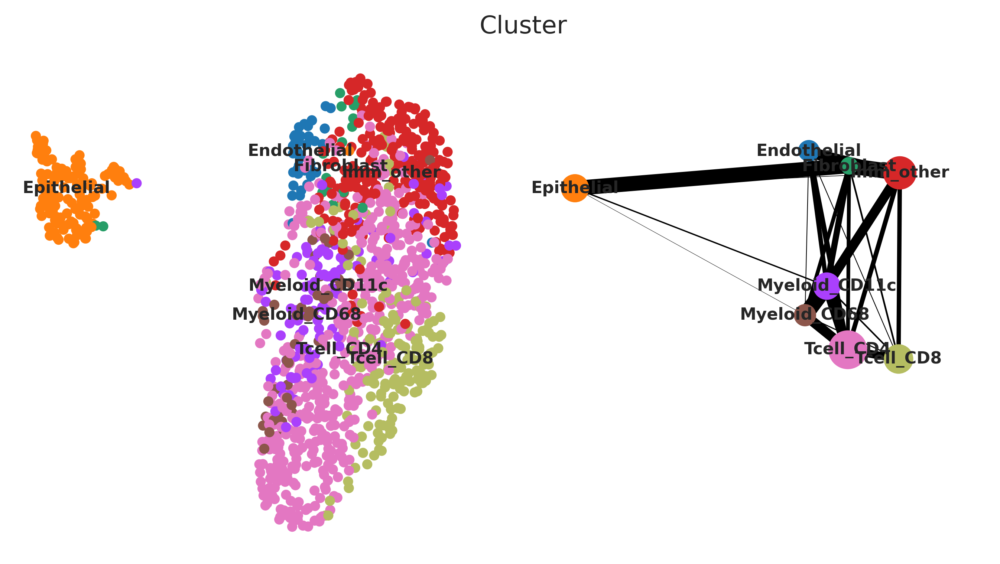

In [43]:
cls_key = 'Cluster'
sc.tl.paga(adata,groups=cls_key)
sc.pl.paga_compare(adata,basis='X_umap')

In [44]:
gd_method = 'paga_guided_umap'
gd = get_ground_distance(adata,method=gd_method,cls_key=cls_key,embed_key=None,connect_threshold=0.5)  
# G,embed_center_distmat,adjacent_paga_bool = get_ground_distance(adata,method=gd_method,cls_key=cls_key,embed_key=None,connect_threshold=0.5)  


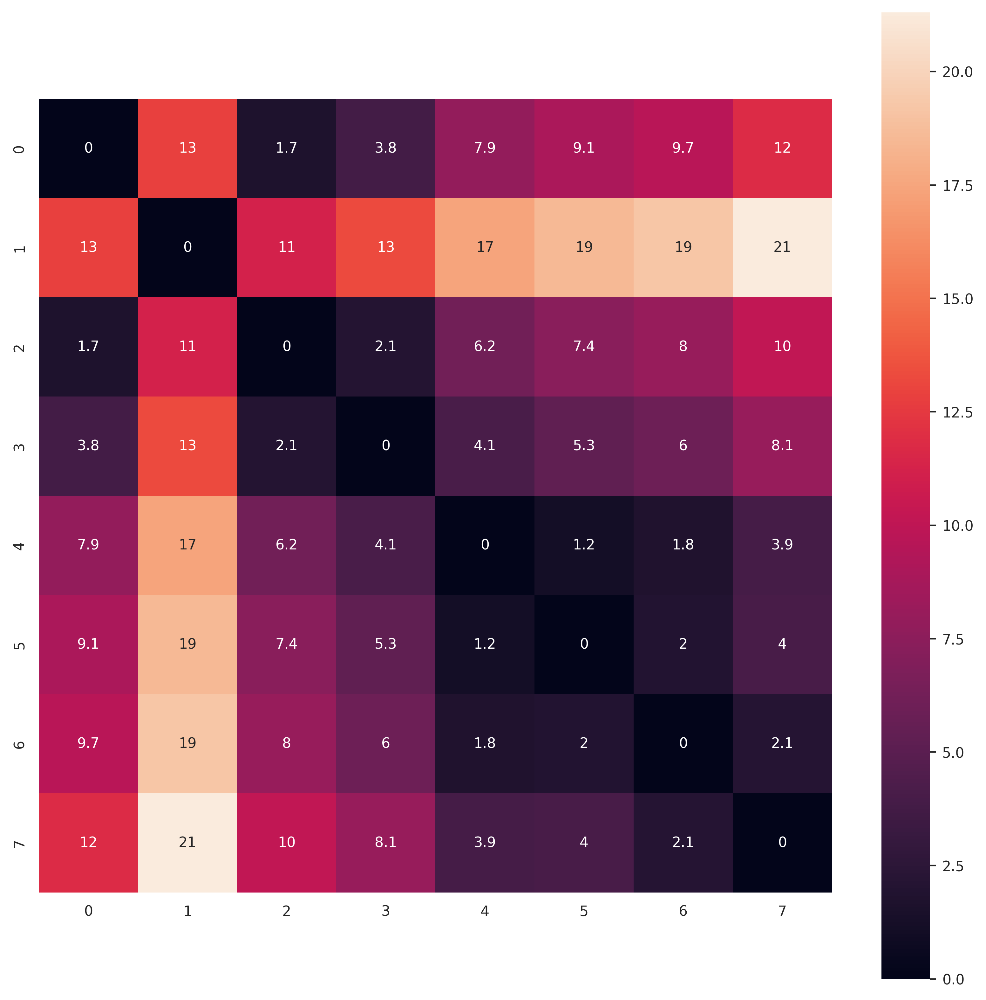

In [45]:
plot_matrix(gd)

In [46]:
heter_key = 'ME_heter_{0}_{1}'.format(cls_key,gd_method)

cal_ME_heterogeneity(adata,copy=False,key_added=heter_key) 

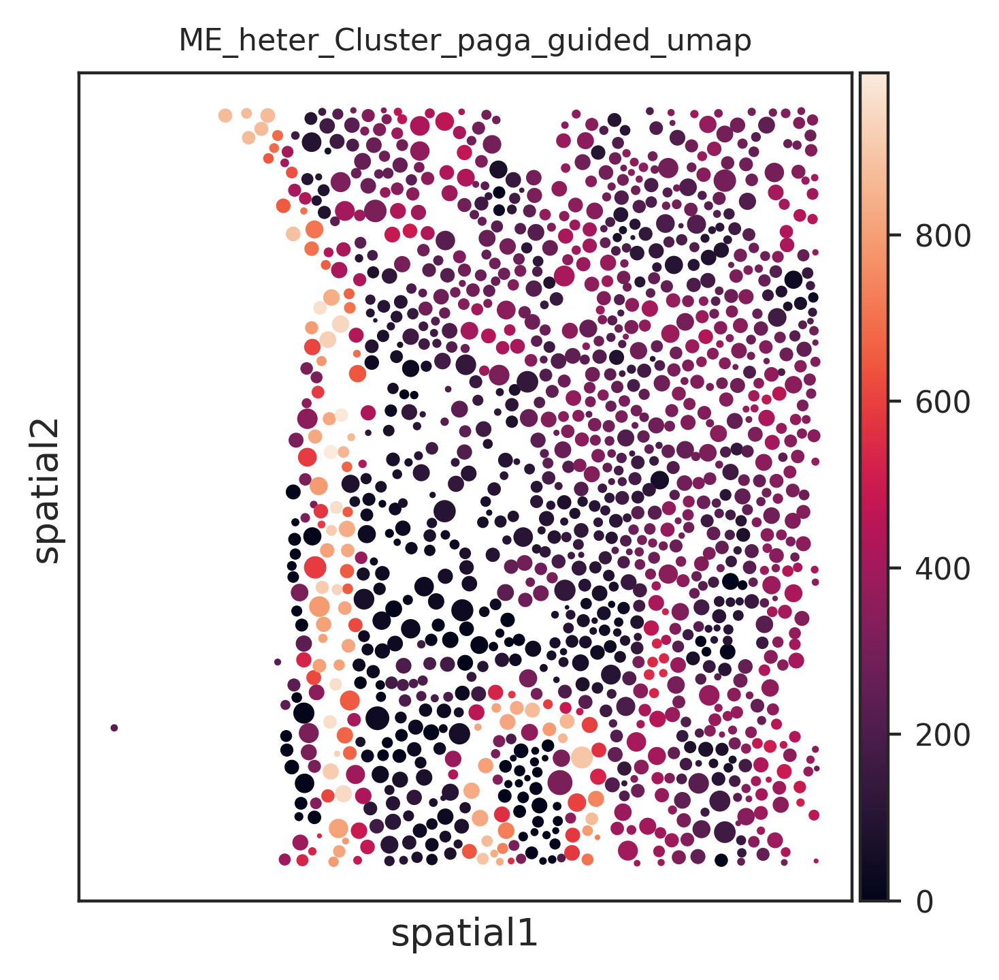

In [47]:
sc.pl.embedding(adata, basis='spatial', color=['ME_heter_Cluster_paga_guided_umap'], size=adata.obs['cell_size']/10) 


# test smooth

In [88]:
leiden_knn = knn_smooth(adata,cls_key='Cluster',knn_iters=50,diff_threshold=10,knn=10,weights_mode='paga')
# adata.obs['leiden_knn'] = leiden_knn
# adata.obs['leiden_knn'] = adata.obs['leiden_knn'].astype('category')
# adata.obs['leiden_knn'].cat.reorder_categories(adata.obs['leiden'].cat.categories,inplace=True)

fit1
fit2
predict
(8,) (1023,)
(1023, 1)
(1023, 1)
281
fit1
fit2
predict
(8,) (1023,)
(1023, 1)
(1023, 1)
102
fit1
fit2
predict
(8,) (1023,)
(1023, 1)
(1023, 1)
42
fit1
fit2
predict
(8,) (1023,)
(1023, 1)
(1023, 1)
9
converge i=3


/tmp/ipykernel_29845/4180454781.py:40: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  adata.obs['{0}_knn'.format(cls_key)].cat.reorder_categories(adata.obs[cls_key].cat.categories,inplace=True)


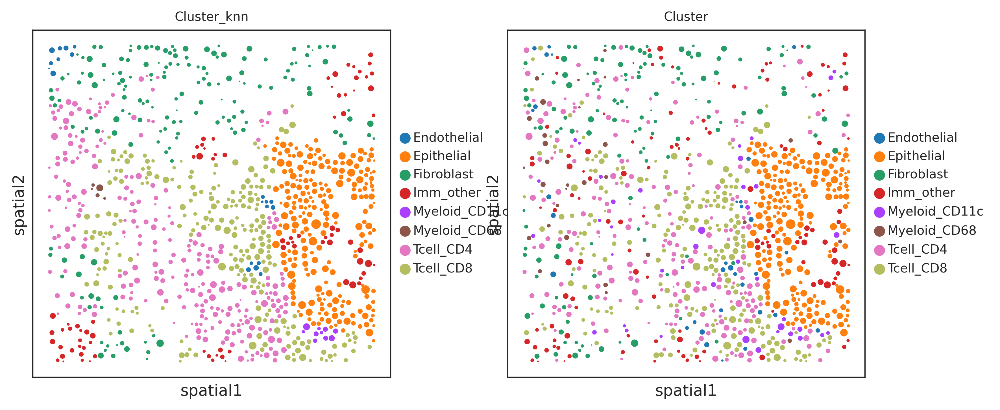

In [90]:
# sc.pl.embedding(adata,color=['Cluster_knn','Cluster'])
sc.pl.embedding(adata, basis='spatial', color=['Cluster_knn','Cluster'], size=adata.obs['cell_size']/10) 


# MED_phEMD

In [49]:
knn=10
# ME_var_names_np_unique = np.unique(adata.obs[use_cls])
# MED(adata,use_cls=use_cls,nn=knn,copy=False,ME_var_names_np_unique=ME_var_names_np_unique,spatial_var='spatial')



adata_phEMD = MED_phEMD(
    adata.copy(),
    GD_method=gd_method,
    MED_knn=knn,
    CT_obs=cls_key,
    ifspatialplot=False,
    OT_method='pyemd',
    ME_precompyted=True,
    GD_precomputed=True
)

0 1638271883.906073
100 4.918978214263916
200 4.464269161224365
300 4.0732691287994385
400 3.617187976837158
500 3.232618808746338
600 2.8221652507781982
700 2.4287314414978027
800 2.0209834575653076
900 1.6090590953826904
1000 1.193739414215088
1100 0.7852787971496582
1200 0.3766629695892334


# ME  embedding

In [50]:
# if adata.shape<4096
# get ME EMD neighbor
emd_distmat = (adata_phEMD.obsm['X_ME_EMD_mat'])
# adata = 
dummy_X = np.arange(adata.shape[0]).reshape(-1,1)
# 用来作为算neighbor的时候的use_rep

def dist_fun(x1,x2,dist_mat=emd_distmat):
    return dist_mat[int(x1[0]),int(x2[0])]
# def dist_fun(x1,x2):
#     return 1

adata.obsm['dummy_X'] = dummy_X
sc.pp.neighbors(adata,use_rep='dummy_X',metric=dist_fun,n_neighbors=50)

adata.uns['neighbors_EMD'] = adata.uns['neighbors'].copy()

In [114]:
# if adata.shape>=4096
emd_distmat = (adata_phEMD.obsm['X_ME_EMD_mat'])

n_neighbors=50
sc.pp.neighbors( adata, n_neighbors=n_neighbors, n_pcs=50)
knn_indices, knn_dists, forest = sc.neighbors.compute_neighbors_umap( emd_distmat, n_neighbors=n_neighbors, metric='precomputed' )
adata.obsp['distances'], adata.obsp['connectivities'] = sc.neighbors._compute_connectivities_umap(
    knn_indices,
    knn_dists,
    adata.shape[0],
    n_neighbors, # change to neighbors you plan to use
)
adata.uns['neighbors_EMD'] = adata.uns['neighbors'].copy()

## UMAP

In [116]:
sc.tl.umap(adata,neighbors_key='neighbors_EMD')
adata.obsm['X_umap_EMD'] = adata.obsm['X_umap']
sc.tl.leiden(adata,neighbors_key='neighbors_EMD',key_added='leiden_EMD',resolution=0.2)

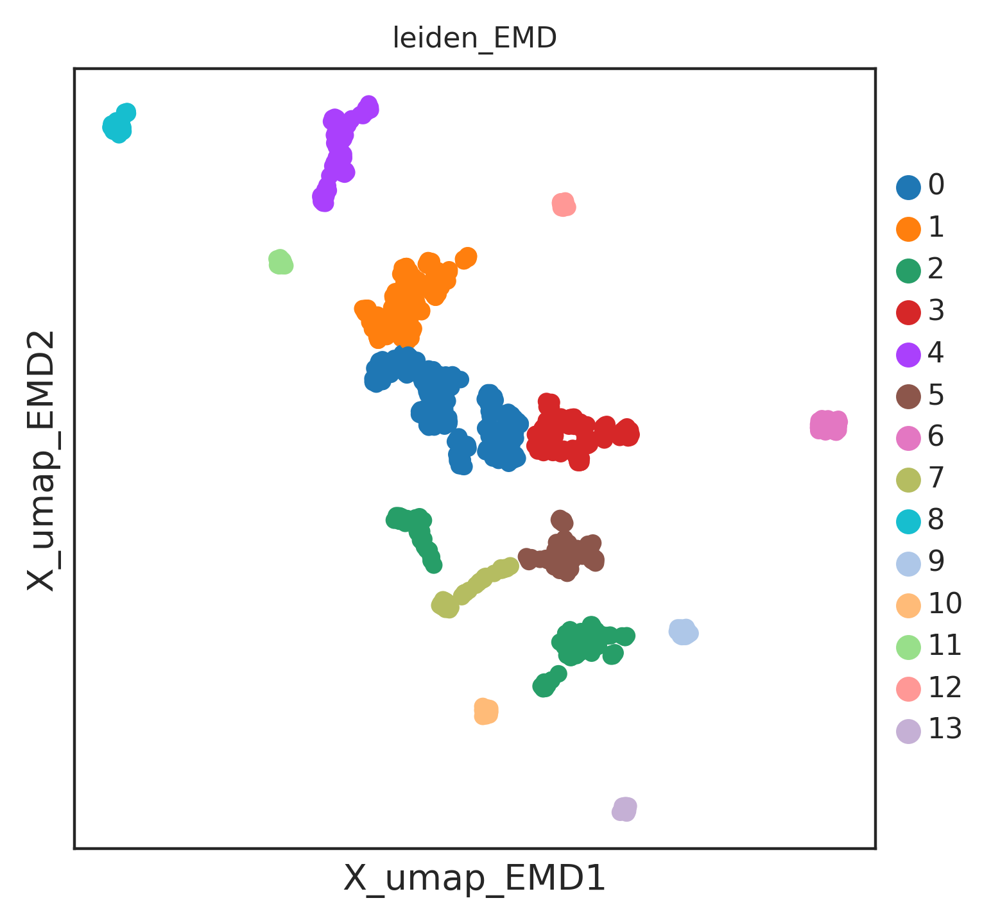

In [117]:
sc.pl.embedding(adata,basis='X_umap_EMD',color='leiden_EMD')

##  EMD clustering on spatial

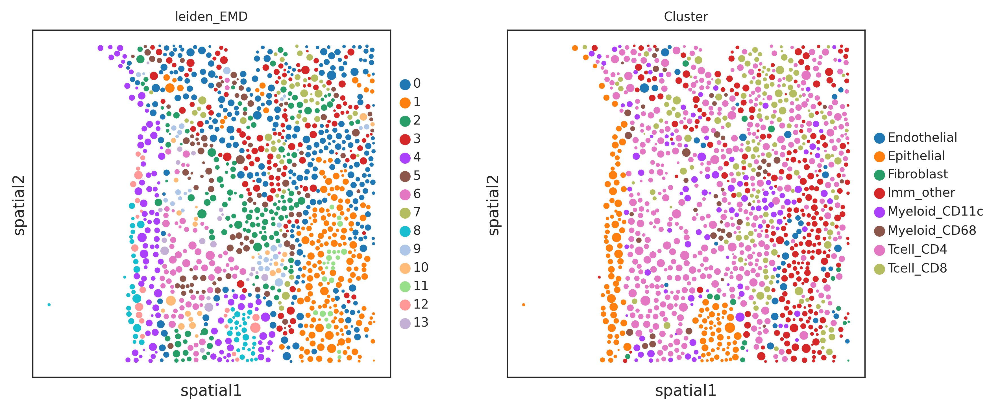

In [118]:
sc.pl.embedding(adata, basis='spatial', color=['leiden_EMD','Cluster'], size=adata.obs['cell_size']/10) 


## EM clustering paga

In [119]:
sc.tl.paga(adata,groups='leiden_EMD',neighbors_key='neighbors_EMD')

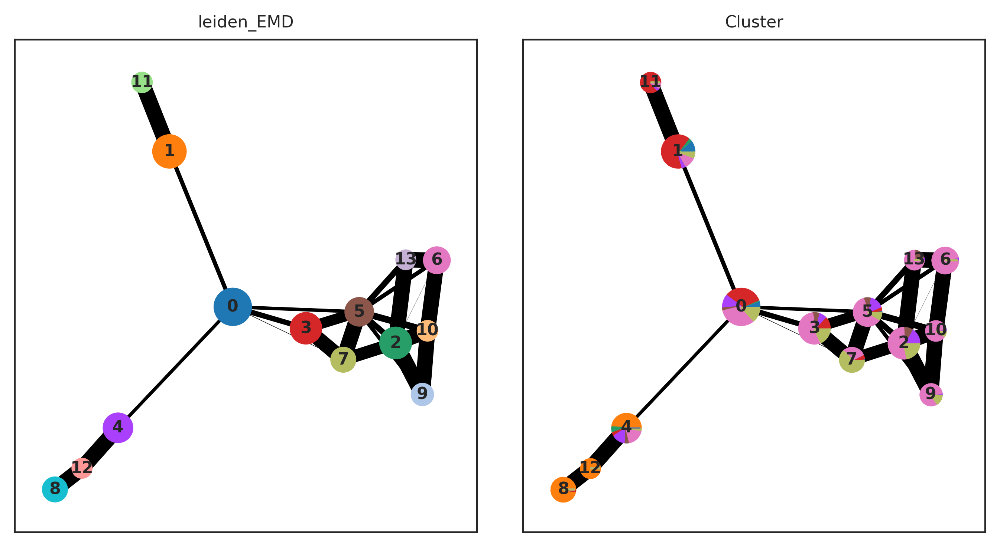

In [120]:
sc.pl.paga(adata,color=['leiden_EMD','Cluster'])

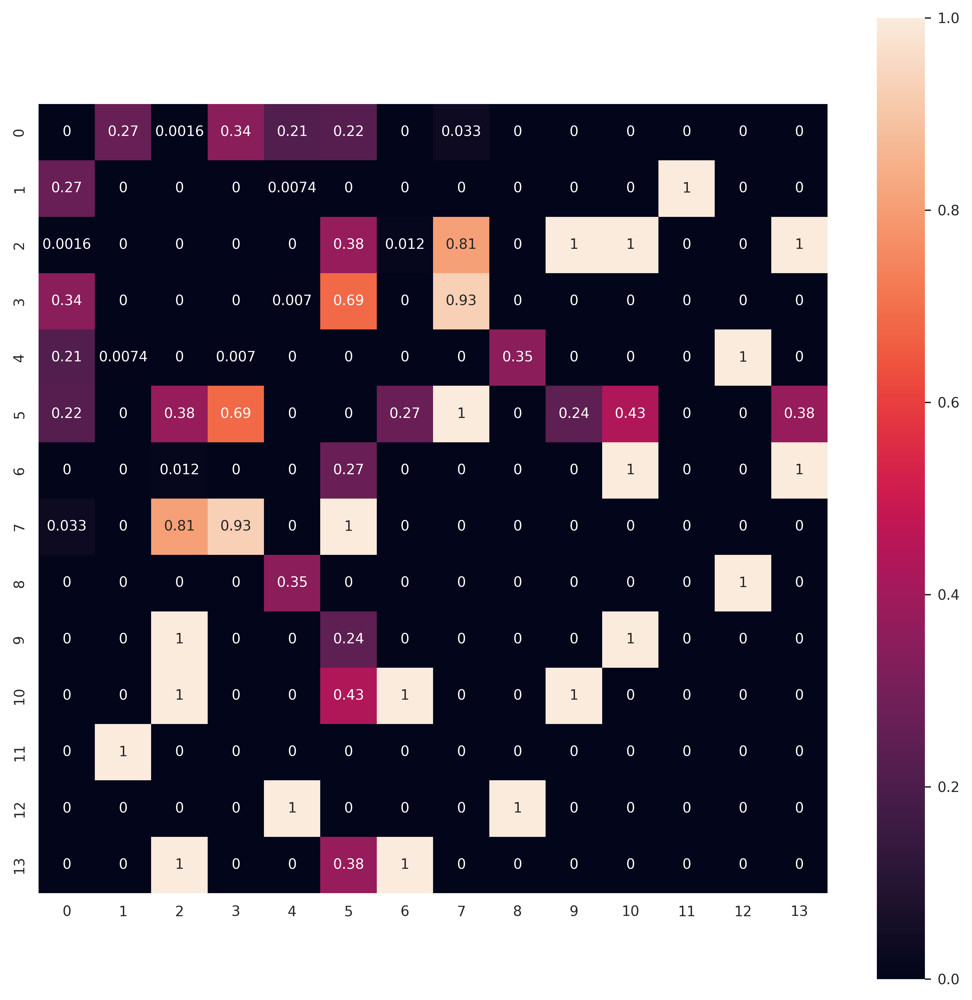

In [121]:
plot_matrix(adata.uns['paga']['connectivities'].toarray())

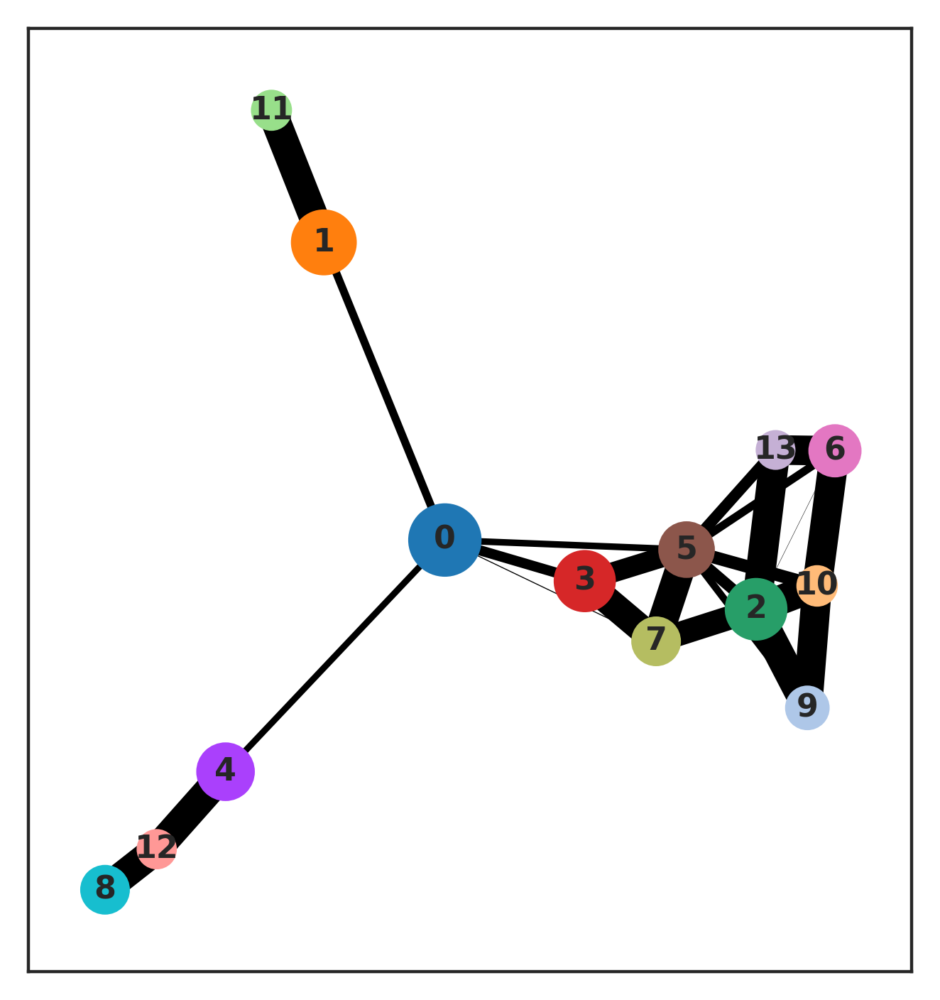

merged 1 to 11
['#1f77b4', '#ff7f0e', '#279e68', '#d62728', '#aa40fc', '#8c564b', '#e377c2', '#b5bd61', '#17becf', '#aec7e8', '#ffbb78', '#98df8a', '#ff9896', '#c5b0d5']
['#1f77b4', '#279e68', '#d62728', '#aa40fc', '#8c564b', '#e377c2', '#b5bd61', '#17becf', '#aec7e8', '#ffbb78', '#98df8a', '#ff9896', '#c5b0d5']


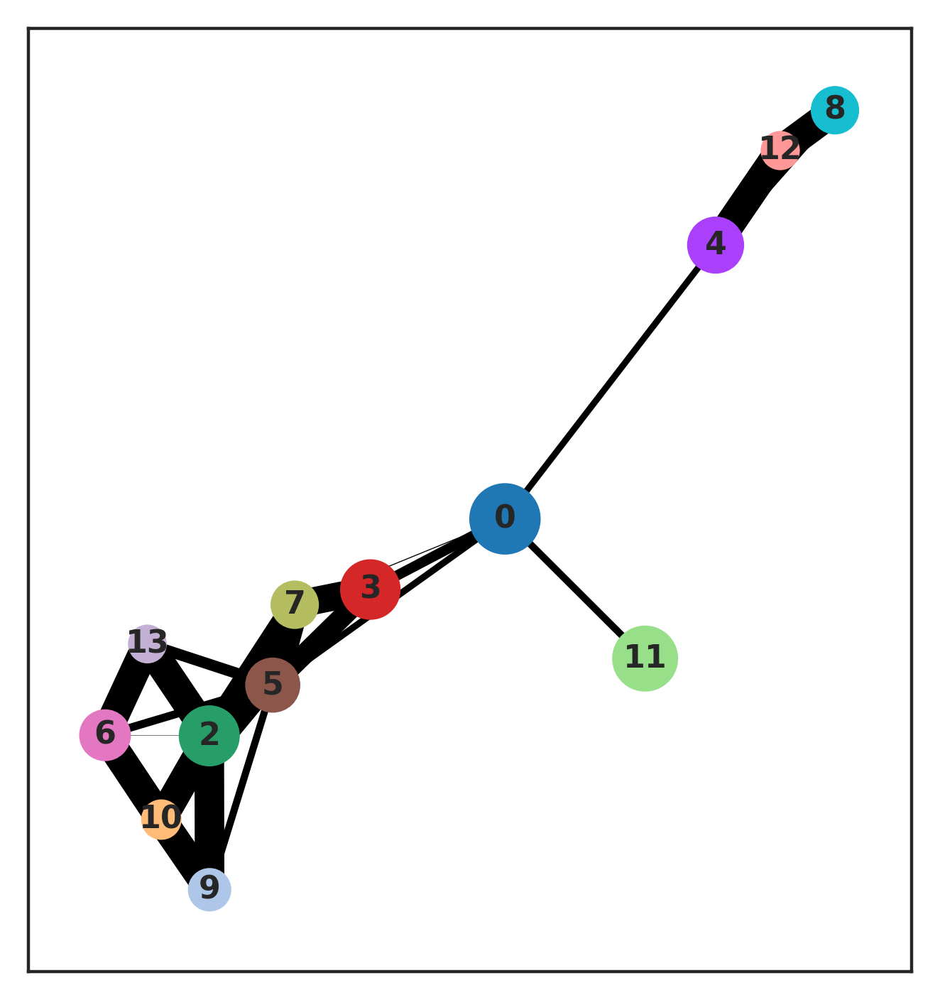

merged 2 to 9
['#1f77b4', '#279e68', '#d62728', '#aa40fc', '#8c564b', '#e377c2', '#b5bd61', '#17becf', '#aec7e8', '#ffbb78', '#98df8a', '#ff9896', '#c5b0d5']
['#1f77b4', '#d62728', '#aa40fc', '#8c564b', '#e377c2', '#b5bd61', '#17becf', '#aec7e8', '#ffbb78', '#98df8a', '#ff9896', '#c5b0d5']


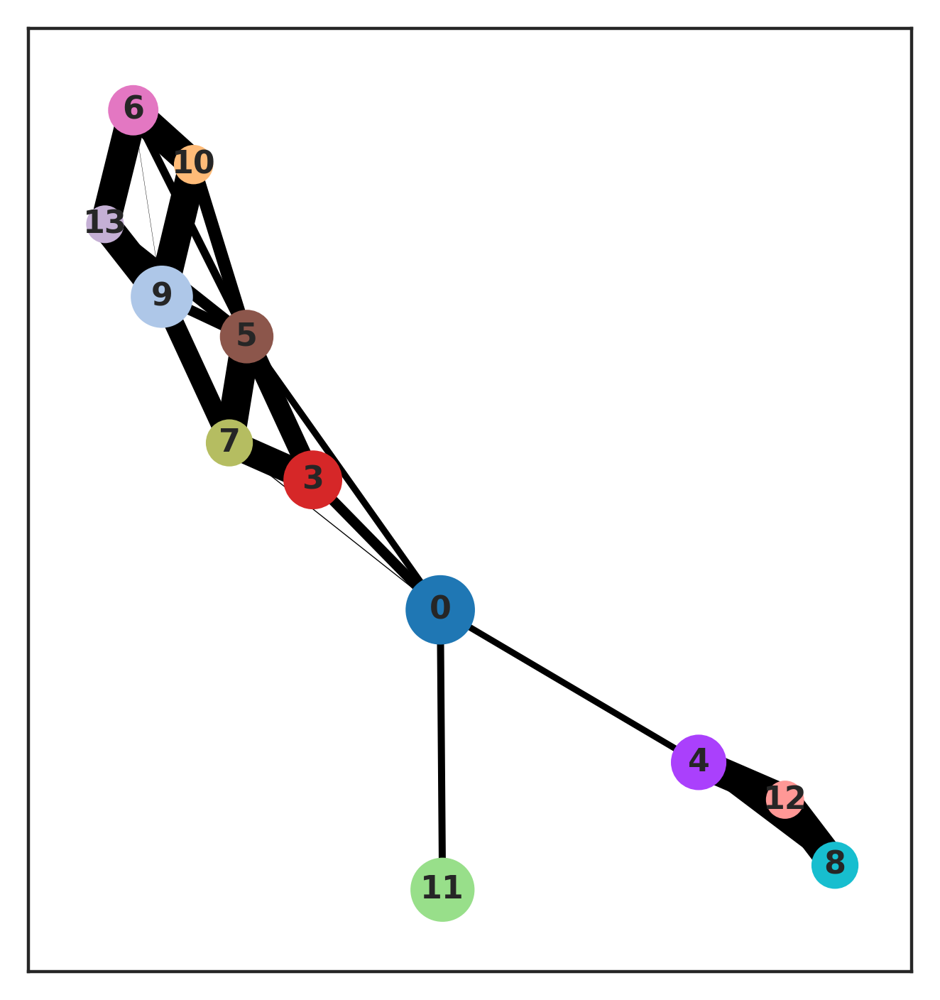

merged 4 to 12
['#1f77b4', '#d62728', '#aa40fc', '#8c564b', '#e377c2', '#b5bd61', '#17becf', '#aec7e8', '#ffbb78', '#98df8a', '#ff9896', '#c5b0d5']
['#1f77b4', '#d62728', '#8c564b', '#e377c2', '#b5bd61', '#17becf', '#aec7e8', '#ffbb78', '#98df8a', '#ff9896', '#c5b0d5']


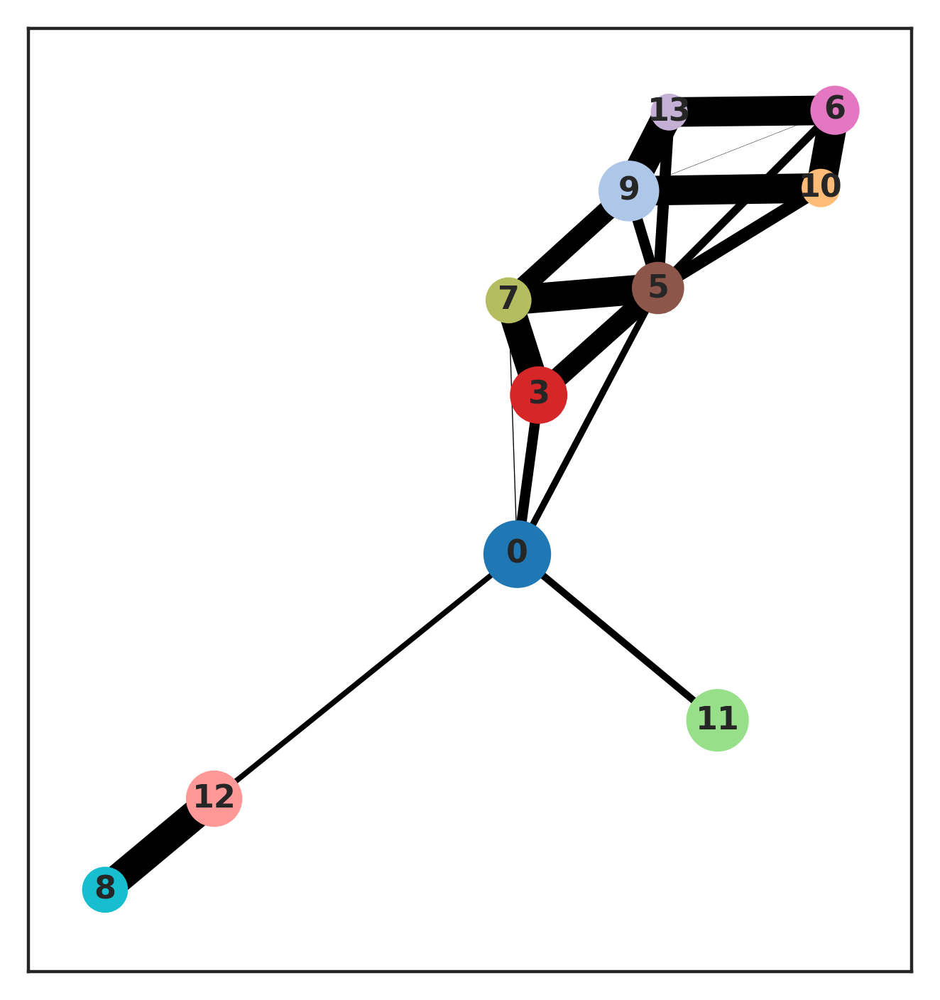

merged 5 to 7
['#1f77b4', '#d62728', '#8c564b', '#e377c2', '#b5bd61', '#17becf', '#aec7e8', '#ffbb78', '#98df8a', '#ff9896', '#c5b0d5']
['#1f77b4', '#d62728', '#e377c2', '#b5bd61', '#17becf', '#aec7e8', '#ffbb78', '#98df8a', '#ff9896', '#c5b0d5']


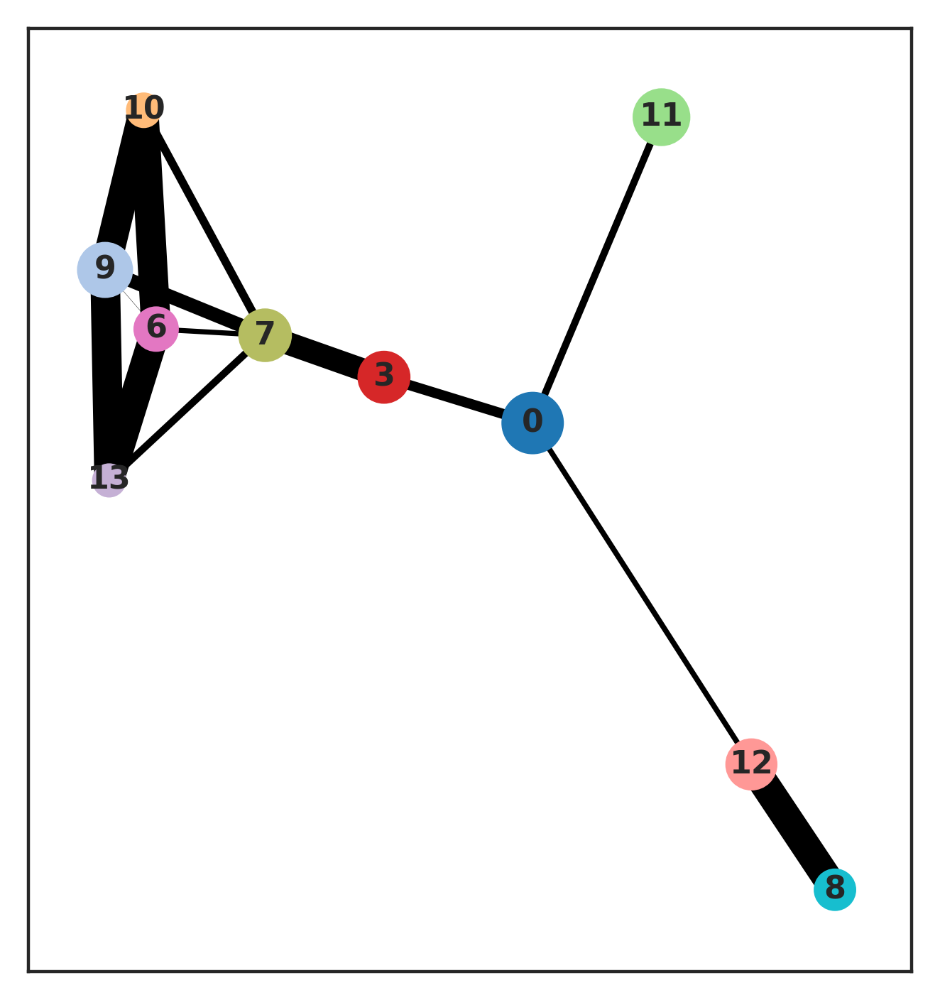

merged 6 to 10
['#1f77b4', '#d62728', '#e377c2', '#b5bd61', '#17becf', '#aec7e8', '#ffbb78', '#98df8a', '#ff9896', '#c5b0d5']
['#1f77b4', '#d62728', '#b5bd61', '#17becf', '#aec7e8', '#ffbb78', '#98df8a', '#ff9896', '#c5b0d5']


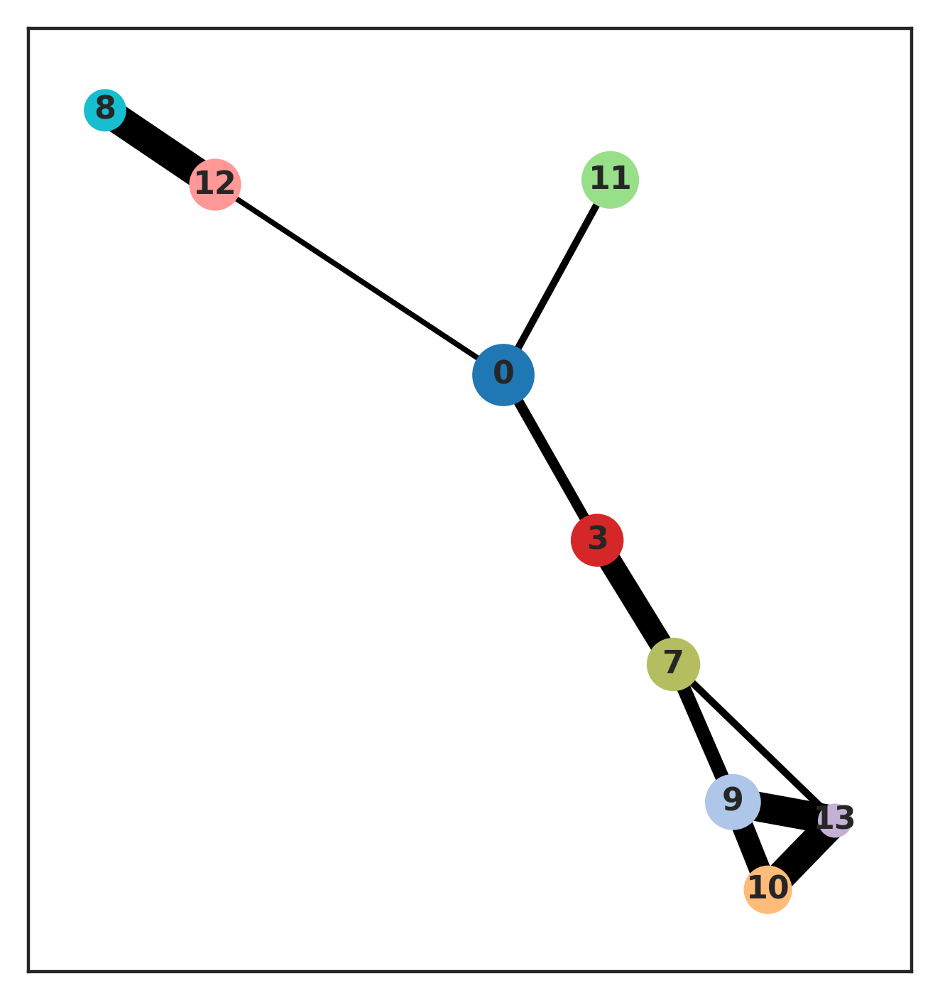

merged 8 to 12
['#1f77b4', '#d62728', '#b5bd61', '#17becf', '#aec7e8', '#ffbb78', '#98df8a', '#ff9896', '#c5b0d5']
['#1f77b4', '#d62728', '#b5bd61', '#aec7e8', '#ffbb78', '#98df8a', '#ff9896', '#c5b0d5']


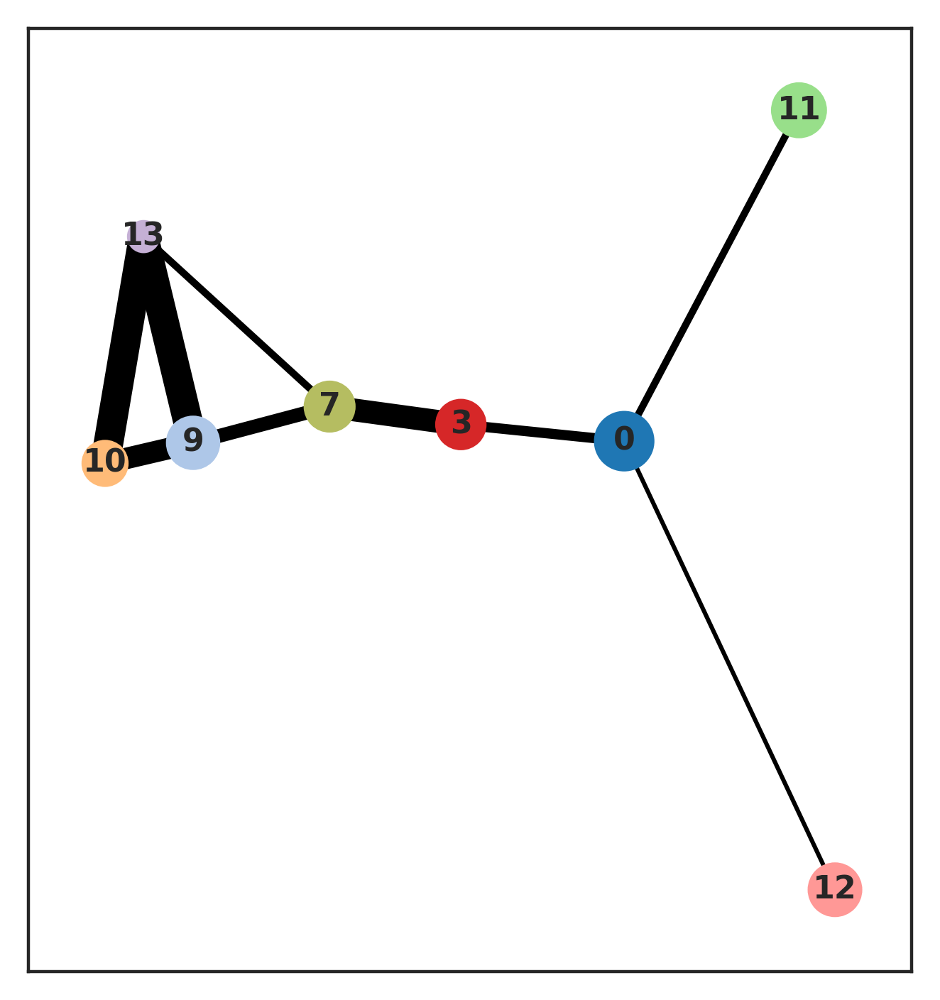

merged 9 to 13
['#1f77b4', '#d62728', '#b5bd61', '#aec7e8', '#ffbb78', '#98df8a', '#ff9896', '#c5b0d5']
['#1f77b4', '#d62728', '#b5bd61', '#ffbb78', '#98df8a', '#ff9896', '#c5b0d5']


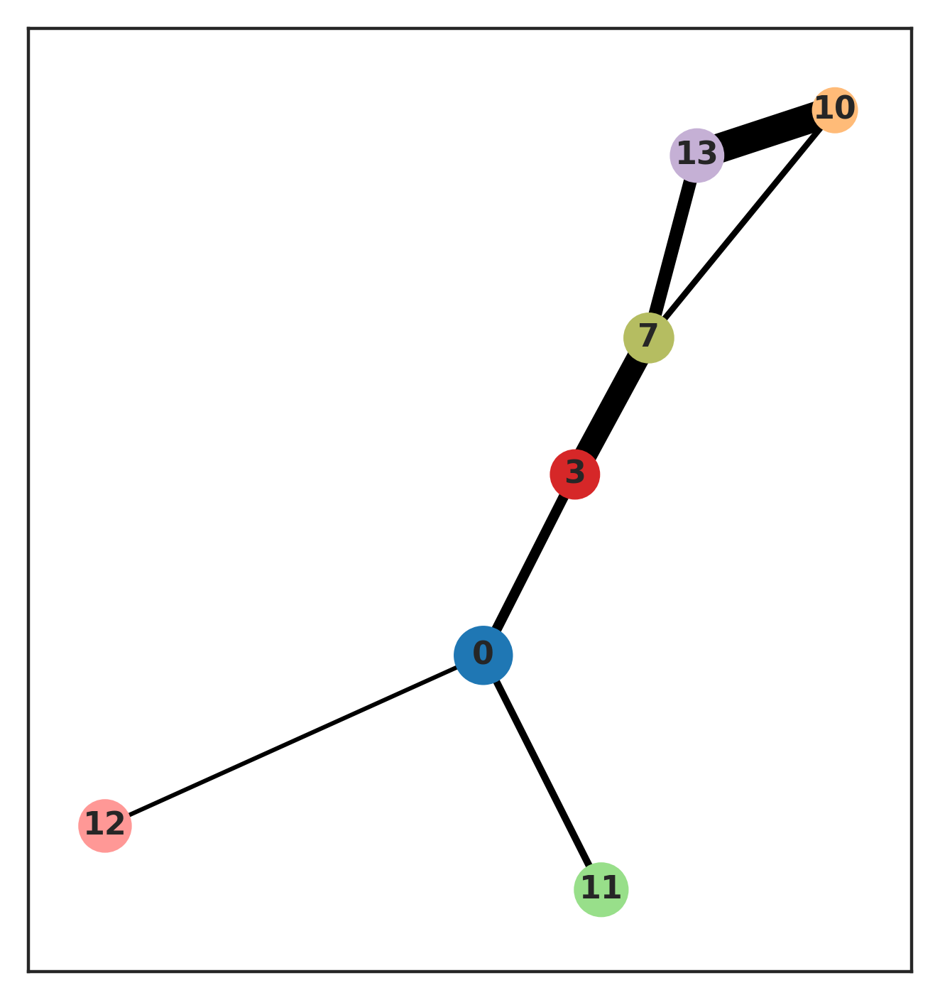

merged 10 to 13
['#1f77b4', '#d62728', '#b5bd61', '#ffbb78', '#98df8a', '#ff9896', '#c5b0d5']
['#1f77b4', '#d62728', '#b5bd61', '#98df8a', '#ff9896', '#c5b0d5']


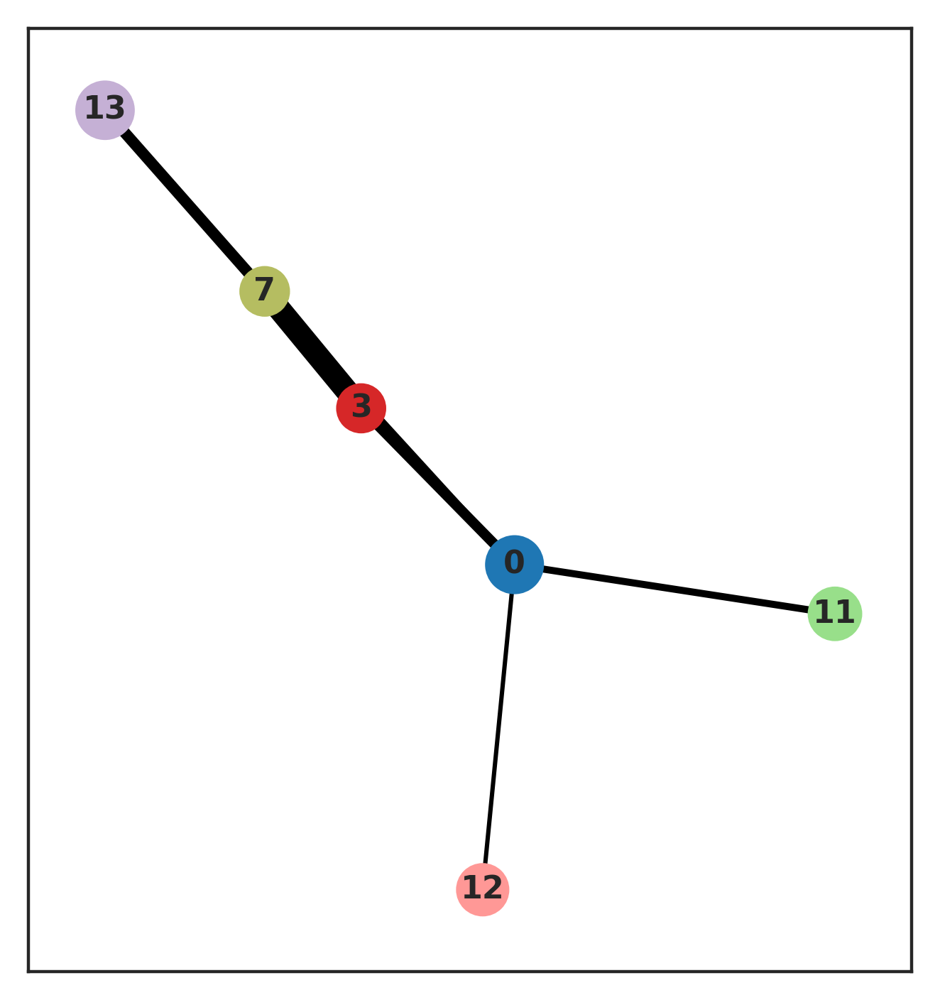

merged 3 to 7
['#1f77b4', '#d62728', '#b5bd61', '#98df8a', '#ff9896', '#c5b0d5']
['#1f77b4', '#b5bd61', '#98df8a', '#ff9896', '#c5b0d5']


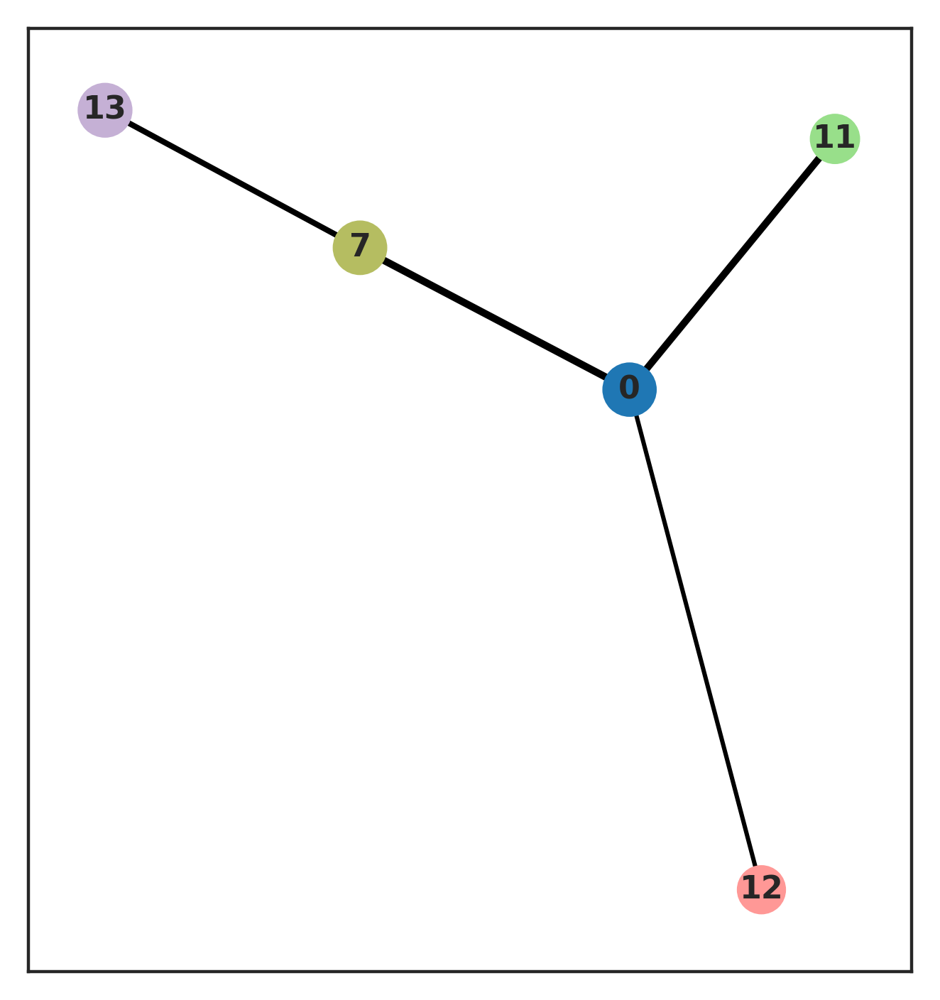

merged 0 to 7
['#1f77b4', '#b5bd61', '#98df8a', '#ff9896', '#c5b0d5']
['#b5bd61', '#98df8a', '#ff9896', '#c5b0d5']


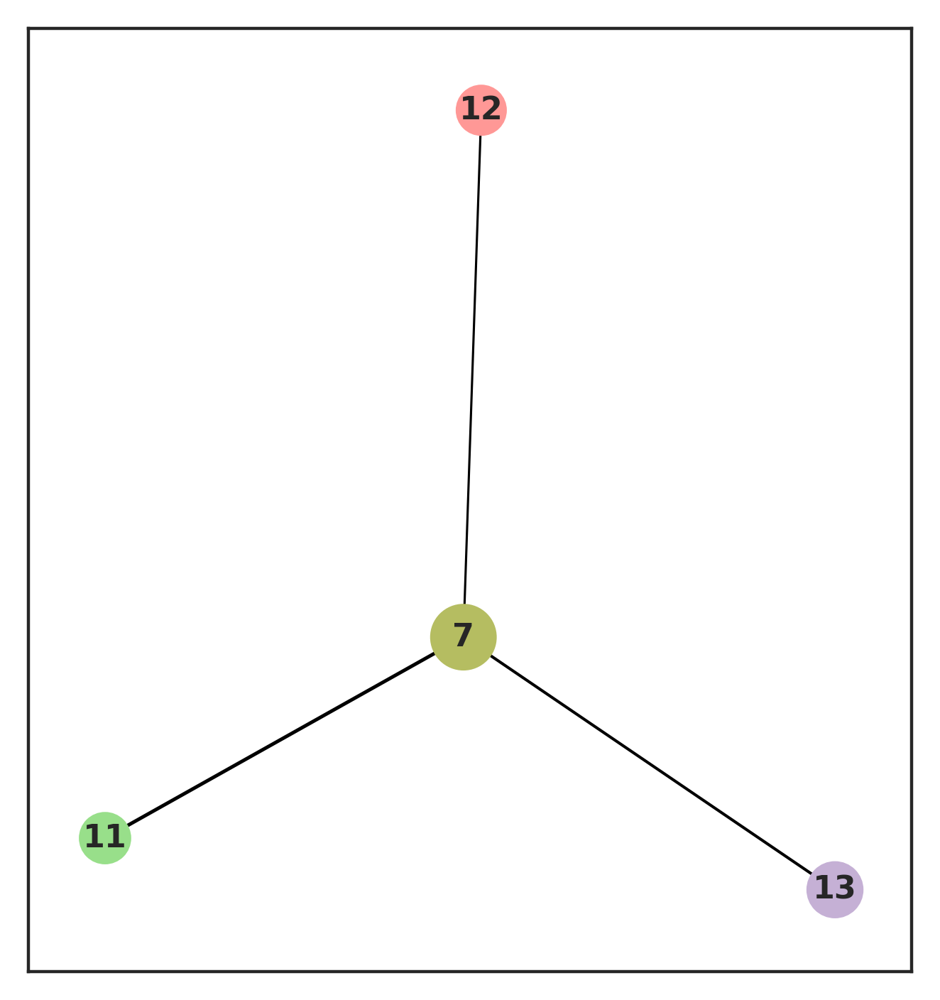

merged 7 to 11
['#b5bd61', '#98df8a', '#ff9896', '#c5b0d5']
['#98df8a', '#ff9896', '#c5b0d5']


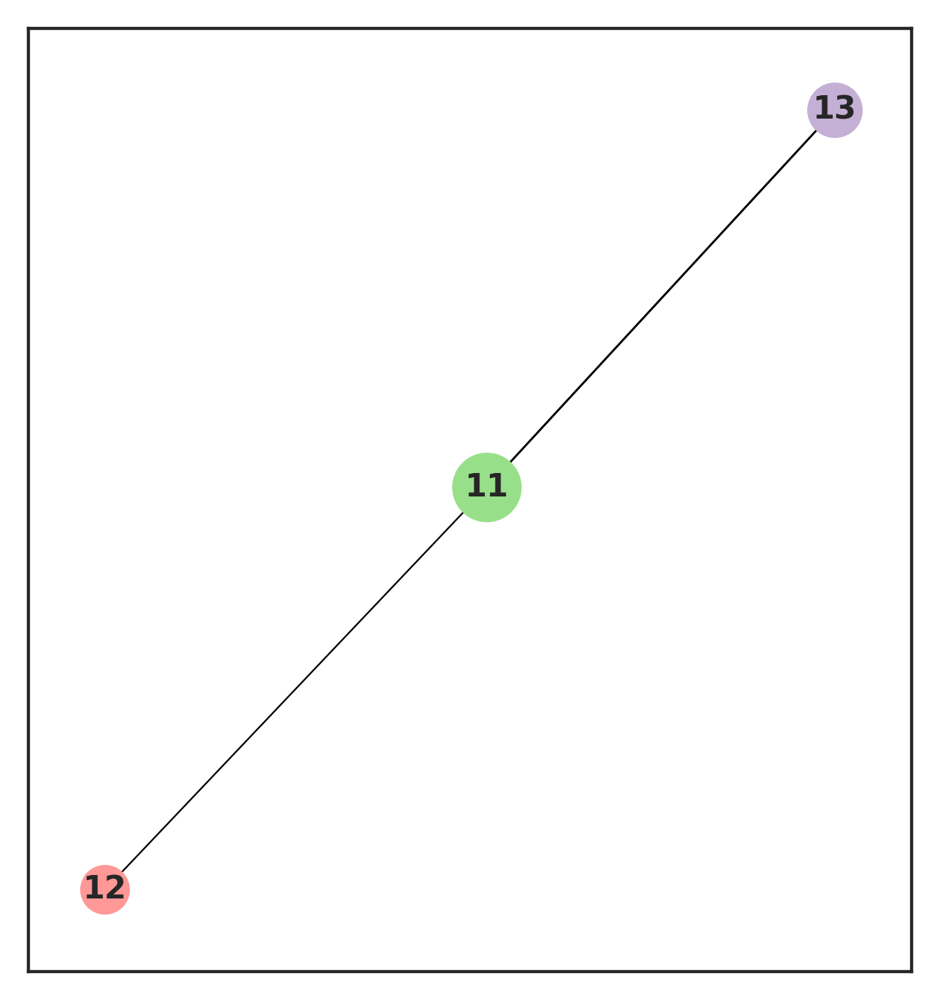

merged 11 to 13
['#98df8a', '#ff9896', '#c5b0d5']
['#ff9896', '#c5b0d5']


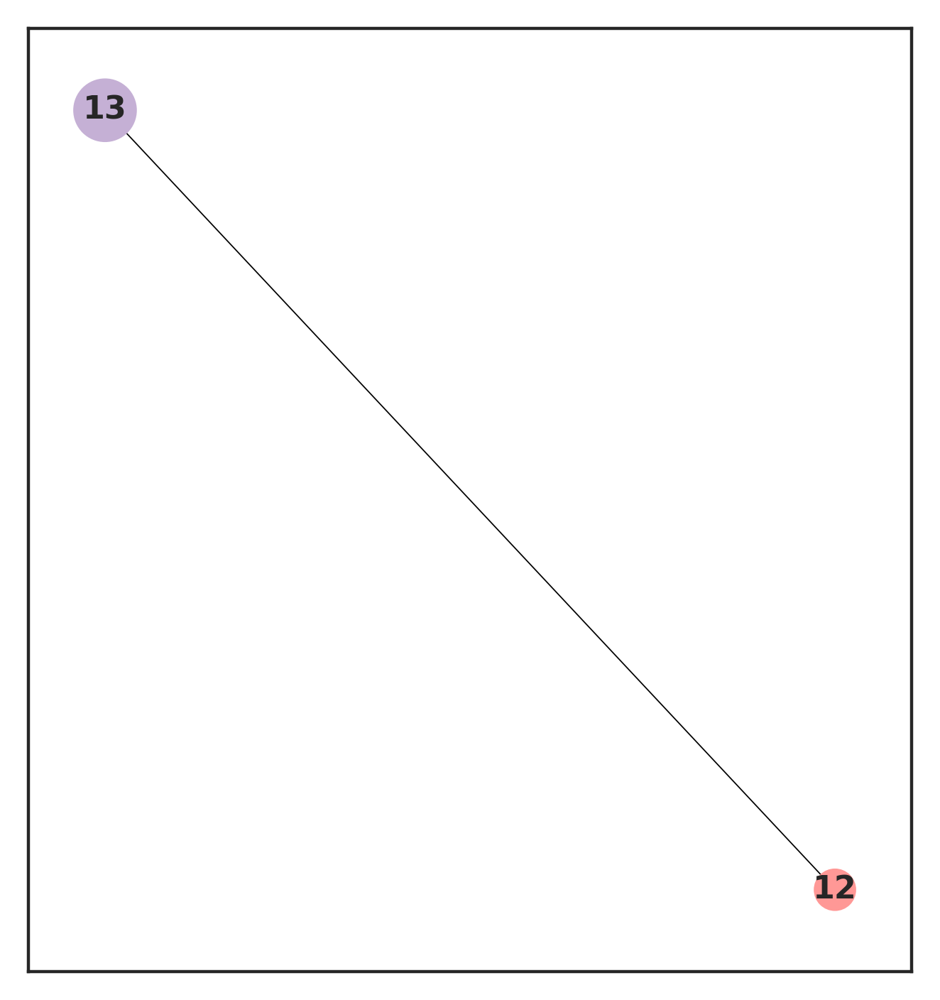

In [122]:
merge_cls_paga(thresh=0)

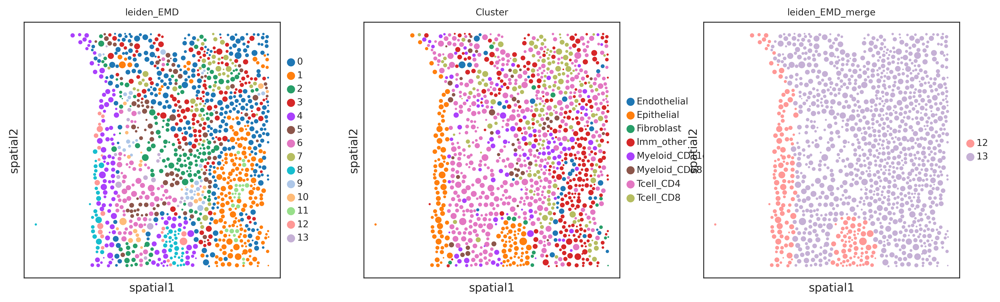

In [123]:
sc.pl.embedding(adata, basis='spatial', color=['leiden_EMD','Cluster','leiden_EMD_merge'], size=adata.obs['cell_size']/10) 


In [128]:
adata.write_h5ad('p23_20211130.h5ad')

# test umap precomputed

In [69]:
import umap
import umap.plot

In [64]:
emd_distmat = (adata_phEMD.obsm['X_ME_EMD_mat'])

mapper = umap.UMAP(n_neighbors=50,metric='precomputed').fit(emd_distmat)

/root/anaconda3/envs/SOTIP/lib/python3.9/site-packages/umap/umap_.py:1780: UserWarning: using precomputed metric; inverse_transform will be unavailable
  warn("using precomputed metric; inverse_transform will be unavailable")


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.


<AxesSubplot:>

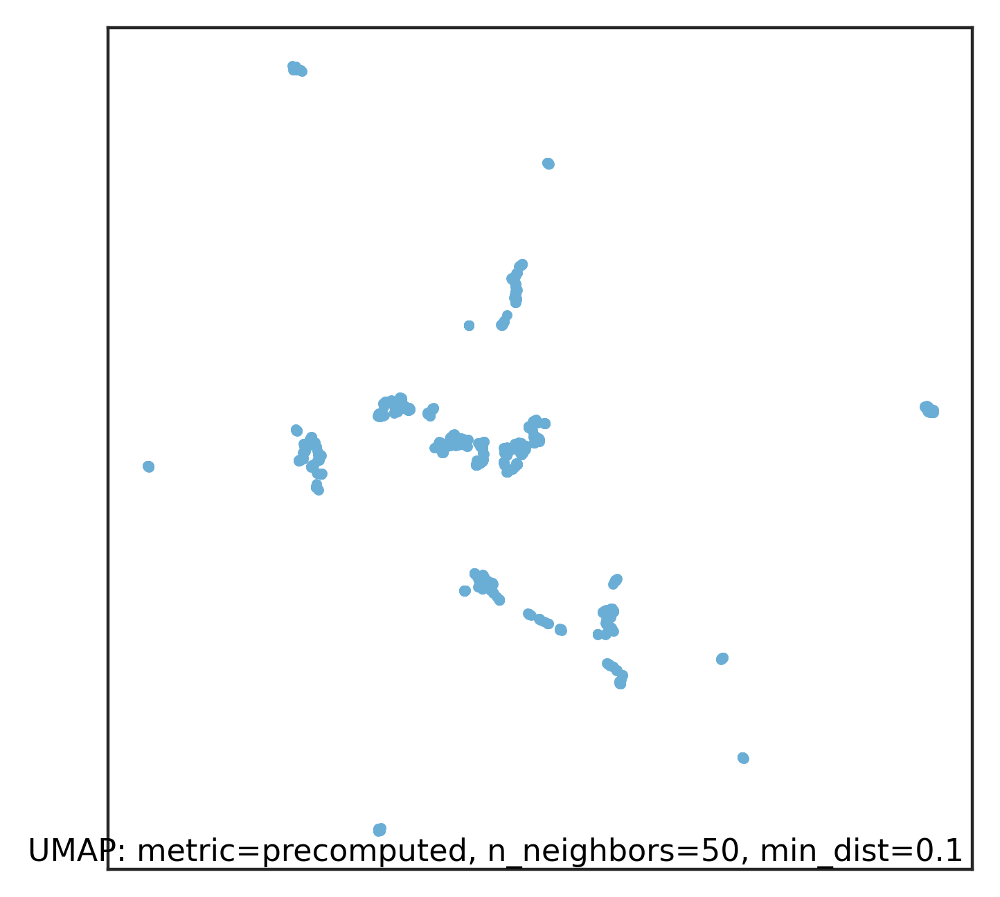

In [70]:
umap.plot.points(mapper)

<AxesSubplot:>

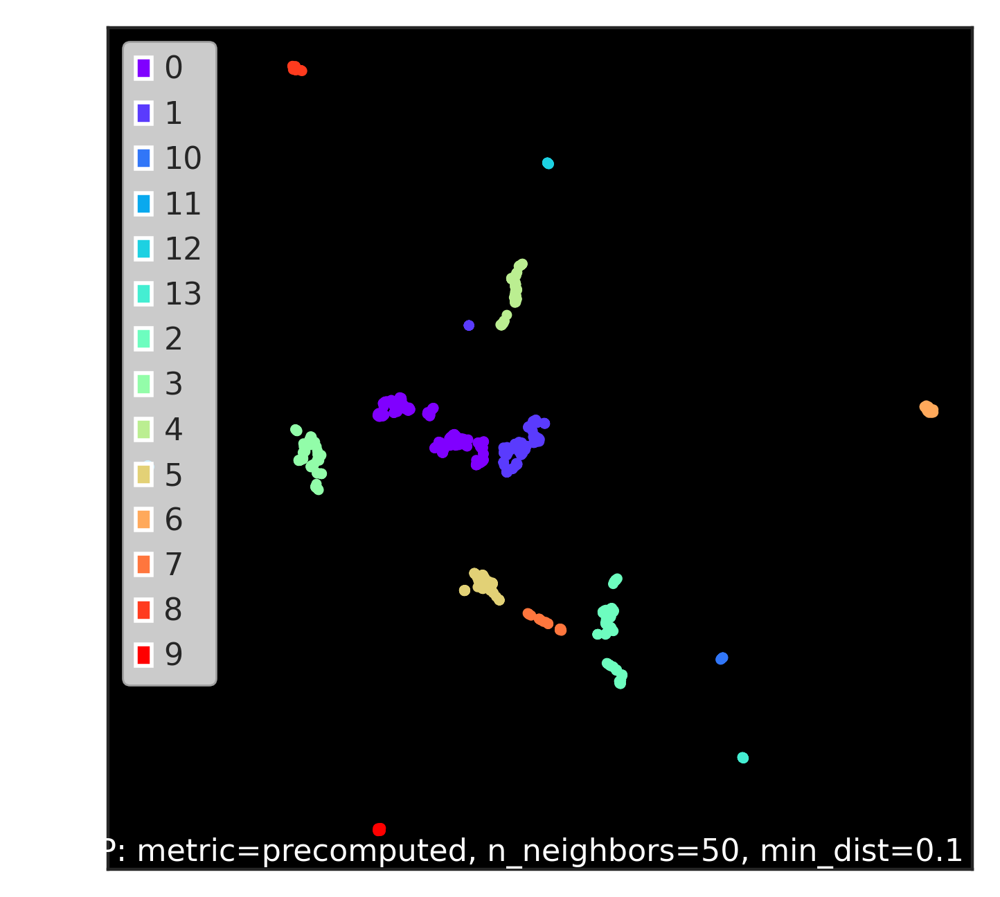

In [72]:
umap.plot.points(mapper, labels=adata.obs['leiden_EMD'],theme='fire')

<AxesSubplot:>

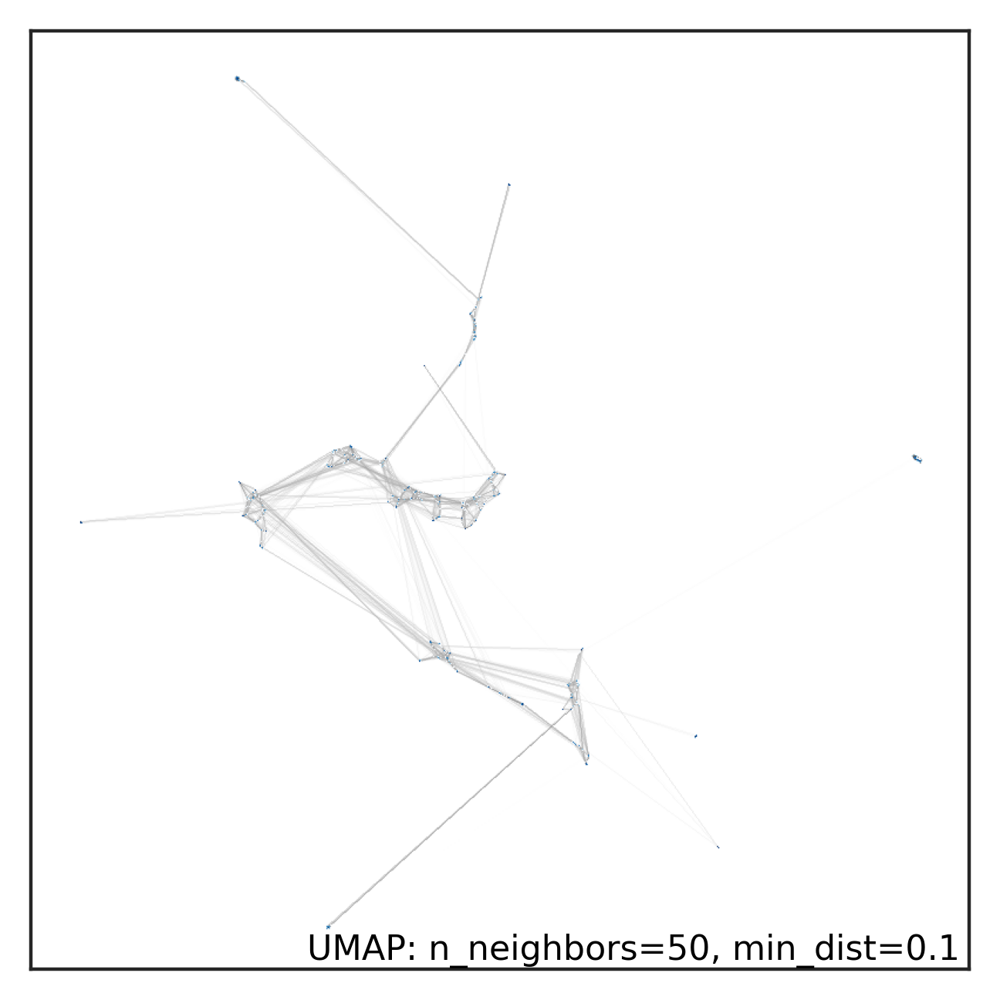

In [73]:
umap.plot.connectivity(mapper, show_points=True)

/root/anaconda3/envs/SOTIP/lib/python3.9/site-packages/umap/plot.py:885: UserWarning: Hammer edge bundling is expensive for large graphs!
This may take a long time to compute!
  warn(


<AxesSubplot:>

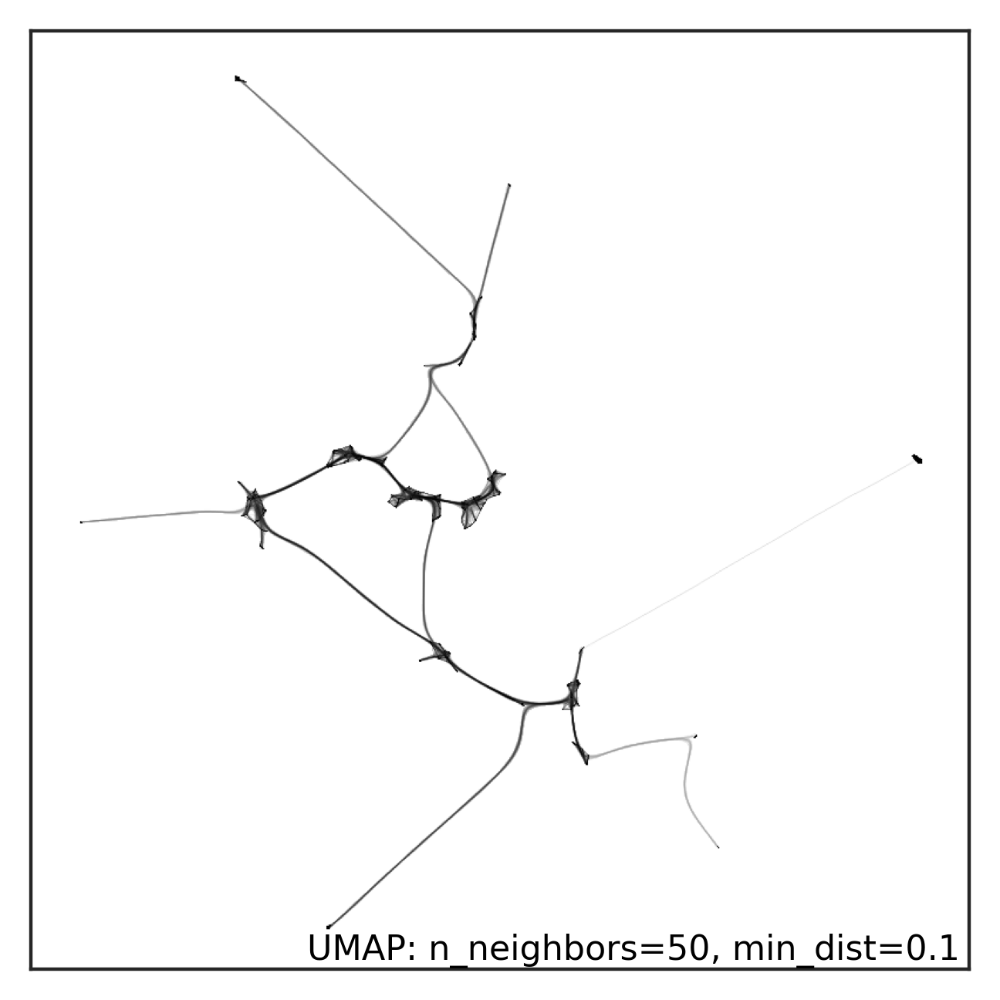

In [74]:
umap.plot.connectivity(mapper, edge_bundling='hammer')

In [84]:
emd_distmat

array([[ 0.        ,  1.32513016,  4.80339047, ..., 14.23239745,
        15.74796761, 17.42963409],
       [ 1.32513016,  0.        ,  3.47826031, ..., 12.90726729,
        14.42283745, 16.10450393],
       [ 4.80339047,  3.47826031,  0.        , ...,  9.42900698,
        10.94457714, 12.62624362],
       ...,
       [14.23239745, 12.90726729,  9.42900698, ...,  0.        ,
         1.93163642,  3.19723665],
       [15.74796761, 14.42283745, 10.94457714, ...,  1.93163642,
         0.        ,  1.80934933],
       [17.42963409, 16.10450393, 12.62624362, ...,  3.19723665,
         1.80934933,  0.        ]])

In [111]:
adata_bak

AnnData object with n_obs × n_vars = 1241 × 36
    obs: 'row_num', 'point', 'cell_id', 'X1', 'center_rowcoord', 'center_colcoord', 'cell_size', 'category', 'donor', 'Cluster', 'leiden', 'ME_heter_Cluster_uniform', 'ME_heter_Cluster_paga_guided_umap', 'leiden_EMD', 'leiden_EMD_merge'
    uns: 'Cluster_colors', 'leiden', 'leiden_colors', 'neighbors', 'point_colors', 'umap', 'MEidx', 'GD', 'paga', 'Cluster_sizes', 'neighbors_EMD', 'leiden_EMD_colors', 'leiden_EMD_sizes', 'leiden_EMD_merge_sizes', 'leiden_EMD_merge_colors', 'merge_cls_list'
    obsm: 'X_umap', 'spatial', 'ME', 'dummy_X', 'X_umap_EMD'
    obsp: 'connectivities', 'distances'

In [88]:
adata_bak = adata.copy()

In [91]:
adata_bak

AnnData object with n_obs × n_vars = 1241 × 36
    obs: 'row_num', 'point', 'cell_id', 'X1', 'center_rowcoord', 'center_colcoord', 'cell_size', 'category', 'donor', 'Cluster', 'leiden', 'ME_heter_Cluster_uniform', 'ME_heter_Cluster_paga_guided_umap', 'leiden_EMD', 'leiden_EMD_merge'
    uns: 'Cluster_colors', 'leiden', 'leiden_colors', 'neighbors', 'point_colors', 'umap', 'MEidx', 'GD', 'paga', 'Cluster_sizes', 'neighbors_EMD', 'leiden_EMD_colors', 'leiden_EMD_sizes', 'leiden_EMD_merge_sizes', 'leiden_EMD_merge_colors', 'merge_cls_list'
    obsm: 'X_umap', 'spatial', 'ME', 'dummy_X', 'X_umap_EMD'
    obsp: 'connectivities', 'distances'

In [90]:
adata_bak.uns['neighbors']

OverloadedDict, wrapping:
	{'connectivities_key': 'connectivities', 'distances_key': 'distances', 'params': {'n_neighbors': 50, 'method': 'umap', 'random_state': 0, 'metric': <function dist_fun at 0x7f19fced7790>, 'use_rep': 'dummy_X'}}
With overloaded keys:
	['connectivities', 'distances'].

In [92]:
del adata.uns['neighbors']

In [97]:
neighbor_dict = {
    'connectivities_key':'umap_conn',
    'distances_key':'umap_dist',
    'params': {
        'n_neighbors': 50, 
        'method': 'umap', 
        'random_state': 0, 
        'metric': 'umap', 
        'use_rep': 'dummy_X'
    }
}
adata.obsp['umap_conn'] = mapper.graph_
adata.obsp['umap_dist'] = emd_distmat

In [98]:
adata.uns['neighbors_umap'] = neighbor_dict

In [99]:
sc.tl.paga(adata,groups='leiden_EMD',neighbors_key='neighbors_umap')

AttributeError: not enough data for array

In [81]:
mapper.graph_dists_

In [106]:
adata

AnnData object with n_obs × n_vars = 1241 × 36
    obs: 'row_num', 'point', 'cell_id', 'X1', 'center_rowcoord', 'center_colcoord', 'cell_size', 'category', 'donor', 'Cluster', 'leiden', 'ME_heter_Cluster_uniform', 'ME_heter_Cluster_paga_guided_umap', 'leiden_EMD', 'leiden_EMD_merge'
    uns: 'Cluster_colors', 'leiden', 'leiden_colors', 'point_colors', 'umap', 'MEidx', 'GD', 'paga', 'Cluster_sizes', 'leiden_EMD_colors', 'leiden_EMD_sizes', 'leiden_EMD_merge_sizes', 'leiden_EMD_merge_colors', 'merge_cls_list'
    obsm: 'X_umap', 'spatial', 'ME', 'dummy_X', 'X_umap_EMD'
    obsp: 'umap_conn', 'umap_dist'

In [105]:
del adata.obsp['distances']

In [107]:
n_neighbors=50
sc.pp.neighbors( adata, n_neighbors=n_neighbors, n_pcs=50)
knn_indices, knn_dists, forest = sc.neighbors.compute_neighbors_umap( emd_distmat, n_neighbors=n_neighbors, metric='precomputed' )
adata.obsp['distances'], adata.obsp['connectivities'] = sc.neighbors._compute_connectivities_umap(
    knn_indices,
    knn_dists,
    adata.shape[0],
    n_neighbors, # change to neighbors you plan to use
)

In [108]:
adata

AnnData object with n_obs × n_vars = 1241 × 36
    obs: 'row_num', 'point', 'cell_id', 'X1', 'center_rowcoord', 'center_colcoord', 'cell_size', 'category', 'donor', 'Cluster', 'leiden', 'ME_heter_Cluster_uniform', 'ME_heter_Cluster_paga_guided_umap', 'leiden_EMD', 'leiden_EMD_merge'
    uns: 'Cluster_colors', 'leiden', 'leiden_colors', 'point_colors', 'umap', 'MEidx', 'GD', 'paga', 'Cluster_sizes', 'leiden_EMD_colors', 'leiden_EMD_sizes', 'leiden_EMD_merge_sizes', 'leiden_EMD_merge_colors', 'merge_cls_list', 'neighbors'
    obsm: 'X_umap', 'spatial', 'ME', 'dummy_X', 'X_umap_EMD'
    obsp: 'umap_conn', 'umap_dist', 'distances', 'connectivities'

In [109]:
sc.tl.paga(adata,groups='leiden_EMD',neighbors_key='neighbors')

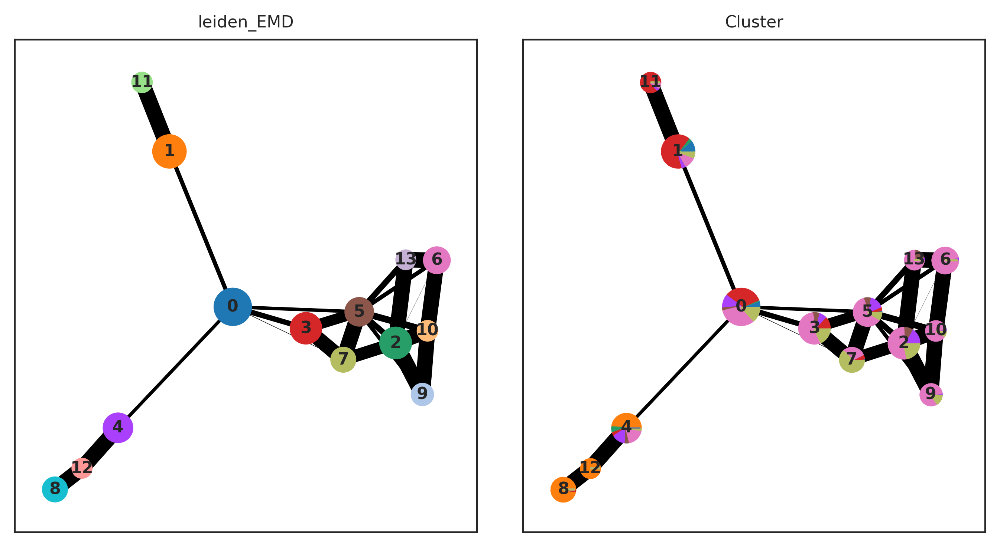

In [110]:
sc.pl.paga(adata,color=['leiden_EMD','Cluster'])

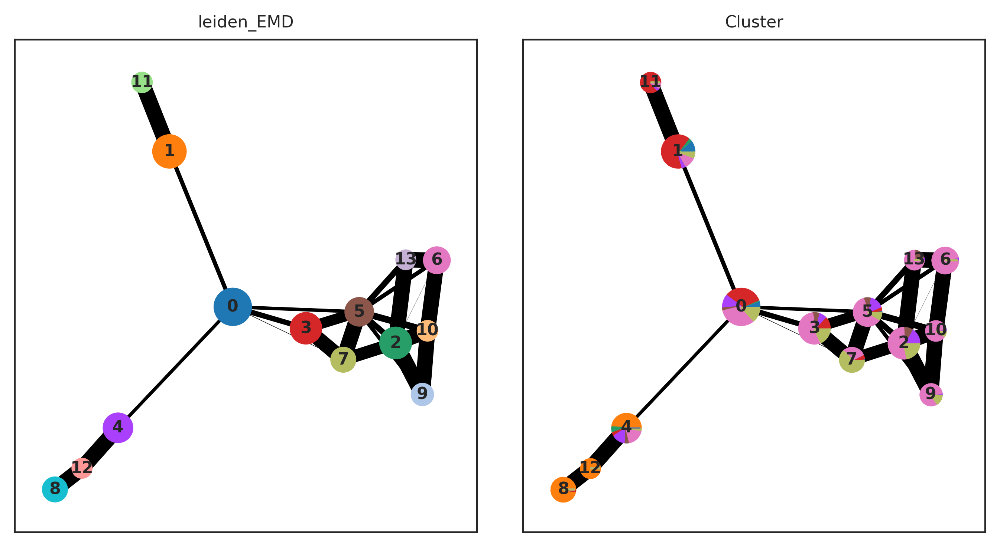

In [55]:
sc.pl.paga(adata,color=['leiden_EMD','Cluster'])

In [ ]:
# get ME EMD neighbor
emd_distmat = (adata_phEMD.obsm['X_ME_EMD_mat'])
# adata = 
dummy_X = np.arange(adata.shape[0]).reshape(-1,1)
# 用来作为算neighbor的时候的use_rep

def dist_fun(x1,x2,dist_mat=emd_distmat):
    return dist_mat[int(x1[0]),int(x2[0])]
# def dist_fun(x1,x2):
#     return 1

adata.obsm['dummy_X'] = dummy_X
sc.pp.neighbors(adata,use_rep='dummy_X',metric=dist_fun,n_neighbors=50)

adata.uns['neighbors_EMD'] = adata.uns['neighbors'].copy()